# Breast Cancer Classification
![Breast Cancer Sample Images](https://miro.medium.com/max/1400/1*pxFCmhRFTighUn88baLcSA.png)

Source: https://miro.medium.com/max/1400/1*pxFCmhRFTighUn88baLcSA.png

Dibuat oleh: Anthony Kevin Oktavius

Library Import

In [108]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import klib
import plotly
import plotly.express as px
from collections import Counter
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn import svm
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import make_pipeline
from scipy.stats import zscore
from statsmodels.stats.outliers_influence import variance_inflation_factor

**Deskripsi Dataset:**

* **Radius:** rata-rata jarak dari tengah ke poin pada perimeter
* **Texture:** standar deviasi dari angka-angka grayscale
* **Perimeter:** keliling dari suatu sel kanker.
* **Area:** area 
* **Smoothness:** variasi lokal pada panjang radius
* **Compactness:** hasil didapatkan dengan menggunakan rumus seperti berikut: keliling ^ 2 / area - 1.0
* **Concavity:** keparahan bentuk cekung
* **Concave points:** jumlah bagian cekung pada garis 
* **Symmetry:** 
* **Fractal dimension:**

Field Initialization

In [109]:
id_number_field = "id_number"
diagnosis_field = "diagnosis"

# Nucleus properties
radius_field = "radius"
texture_field = "texture"
perimeter_field = "perimeter"
area_field = "area"
smoothness_field = "smoothness"
compactness_field = "compactness"
concavity_field = "concavity"
concave_points = "concave points"
symmetry_field = "symmetry"
fractal_dimension_field = "fractal dimension"

# Statistics Types
mean_field = "mean"
standard_error_field = "Standard error"
worst_field = "worst"

# PCA Fields
pca_area_field = 'Area'
pca_concave_field = 'Concave'
pca_texture_field = 'Texture'
smoothness_worst_field = 'smoothness_worst'

Inisialisasi nama masing-masing field

In [110]:
dataset_column_names = [id_number_field, diagnosis_field]
nucleus_property_names = [radius_field, texture_field, perimeter_field, 
                          area_field, smoothness_field, compactness_field,
                          concavity_field, concave_points, symmetry_field,
                          fractal_dimension_field]

statistics_types = [mean_field, standard_error_field, worst_field]

statistics_type = []

for nucleus_index, statistics_type in enumerate(statistics_types):
    for nucleus_property_index, nucleus_property in enumerate(nucleus_property_names):
        dataset_column_names.append(f"{nucleus_property}_{statistics_type}")

print(dataset_column_names)

['id_number', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal dimension_mean', 'radius_Standard error', 'texture_Standard error', 'perimeter_Standard error', 'area_Standard error', 'smoothness_Standard error', 'compactness_Standard error', 'concavity_Standard error', 'concave points_Standard error', 'symmetry_Standard error', 'fractal dimension_Standard error', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal dimension_worst']


Dataset Preview

In [111]:
dataset_name = "breast_cancer.data"
    
breast_cancer_df = pd.read_csv(dataset_name, sep = ',', names = dataset_column_names)
breast_cancer_df

,id_number,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


Melakukan order pada data berdasarkan ID.

In [112]:
breast_cancer_df.sort_values(by = id_number_field)

,id_number,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal dimension_worst
131,8670,M,15.46,19.48,101.70,748.9,0.10920,0.12230,0.14660,0.08087,...,19.26,26.00,124.90,1156.0,0.15460,0.2394,0.3791,0.15140,0.2837,0.08019
287,8913,B,12.89,13.12,81.89,515.9,0.06955,0.03729,0.02260,0.01171,...,13.62,15.54,87.40,577.0,0.09616,0.1147,0.1186,0.05366,0.2309,0.06915
291,8915,B,14.96,19.10,97.03,687.3,0.08992,0.09823,0.05940,0.04819,...,16.25,26.19,109.10,809.8,0.13130,0.3030,0.1804,0.14890,0.2962,0.08472
403,9047,B,12.94,16.17,83.18,507.6,0.09879,0.08836,0.03296,0.02390,...,13.86,23.02,89.69,580.9,0.11720,0.1958,0.1810,0.08388,0.3297,0.07834
47,85715,M,13.17,18.66,85.98,534.6,0.11580,0.12310,0.12260,0.07340,...,15.67,27.95,102.80,759.4,0.17860,0.4166,0.5006,0.20880,0.3900,0.11790
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
449,911157302,M,21.10,20.52,138.10,1384.0,0.09684,0.11750,0.15720,0.11550,...,25.68,32.07,168.20,2022.0,0.13680,0.3101,0.4399,0.22800,0.2268,0.07425
460,911296201,M,17.08,27.15,111.20,930.9,0.09898,0.11100,0.10070,0.06431,...,22.96,34.49,152.10,1648.0,0.16000,0.2444,0.2639,0.15550,0.3010,0.09060
461,911296202,M,27.42,26.27,186.90,2501.0,0.10840,0.19880,0.36350,0.16890,...,36.04,31.37,251.20,4254.0,0.13570,0.4256,0.6833,0.26250,0.2641,0.07427
463,911320501,B,11.60,18.36,73.88,412.7,0.08508,0.05855,0.03367,0.01777,...,12.77,24.02,82.68,495.1,0.13420,0.1808,0.1860,0.08288,0.3210,0.07863


Deskripsi Dataset.

In [113]:
breast_cancer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id_number                         569 non-null    int64  
 1   diagnosis                         569 non-null    object 
 2   radius_mean                       569 non-null    float64
 3   texture_mean                      569 non-null    float64
 4   perimeter_mean                    569 non-null    float64
 5   area_mean                         569 non-null    float64
 6   smoothness_mean                   569 non-null    float64
 7   compactness_mean                  569 non-null    float64
 8   concavity_mean                    569 non-null    float64
 9   concave points_mean               569 non-null    float64
 10  symmetry_mean                     569 non-null    float64
 11  fractal dimension_mean            569 non-null    float64
 12  radius_S

Melihat Data Statistika

In [114]:
breast_cancer_df.describe()

,id_number,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


Melakukan list variabel-variabel yang kategorik ataupun numerik.

In [115]:
categorical_variables = [diagnosis_field]

numerical_variables = breast_cancer_df.columns.to_list()
numerical_variables.remove(id_number_field)
numerical_variables.remove(diagnosis_field)

print(categorical_variables)
print(numerical_variables)

print(len(categorical_variables))
print(len(numerical_variables))

['diagnosis']
['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal dimension_mean', 'radius_Standard error', 'texture_Standard error', 'perimeter_Standard error', 'area_Standard error', 'smoothness_Standard error', 'compactness_Standard error', 'concavity_Standard error', 'concave points_Standard error', 'symmetry_Standard error', 'fractal dimension_Standard error', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal dimension_worst']
1
30


In [116]:
feature_variables = numerical_variables.copy() 
target_variables = diagnosis_field

## Data Visualization

Definisi Fungsi untuk Data Visualisasi

In [117]:
def get_plot_figure(width, height):
    figure = plt.figure()
    figure.set_figwidth(width)
    figure.set_figheight(height)
    return figure

### Single Variable

#### Categorical Variables

Pie Chart - Composition

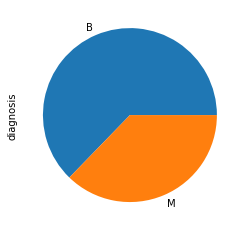

In [118]:
for index, categorical_variable in enumerate(categorical_variables):
    breast_cancer_df[categorical_variable].value_counts().plot(kind = 'pie')

**Insight:**

Pada field tersebut, terdapat data yang tidak seimbang antara benign dan malignant. Pada tahap data preprocessing, kita akan mencoba untuk menyeimbangkan data dengan teknik oversampling.

Bar Chart - Comparison

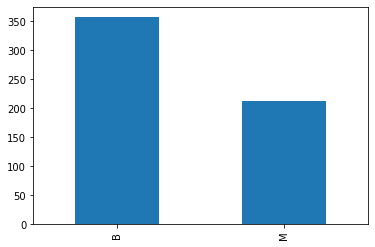

In [119]:
for index, categorical_variable in enumerate(categorical_variables):
    breast_cancer_df[categorical_variable].value_counts().plot(kind = 'bar')

**Insight:**

Selisih antara jumlah benign dan malignant adalah sekitar 150 data. Ini merupakan perbedaan yang cukup jauh. Pada tahap preprocessing, saya akan melakukan teknik oversampling untuk menyeimbangkan data.

#### Numerical Variables

Distribution Plot - Distribution

Note: The number of non binary numerical features is very large (30), please consider splitting the data. Showing plots for the first 20 numerical features. Override this by setting showall=True.


<AxesSubplot:xlabel='fractal dimension_Standard error', ylabel='Density'>

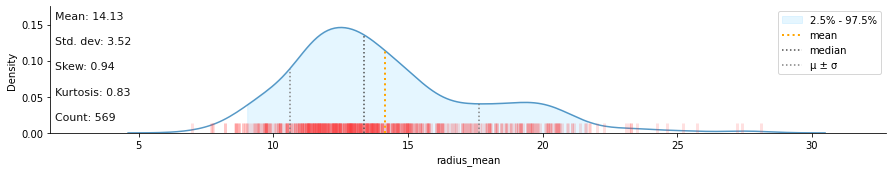

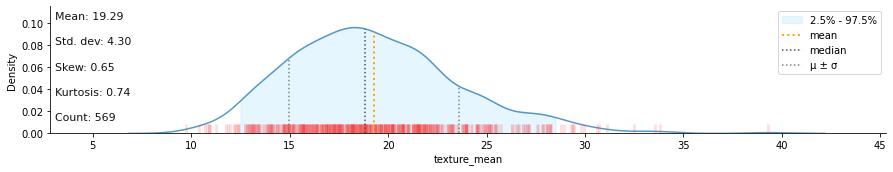

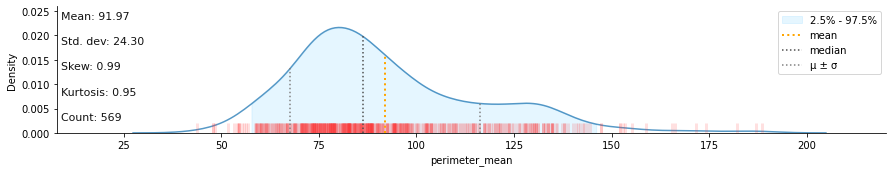

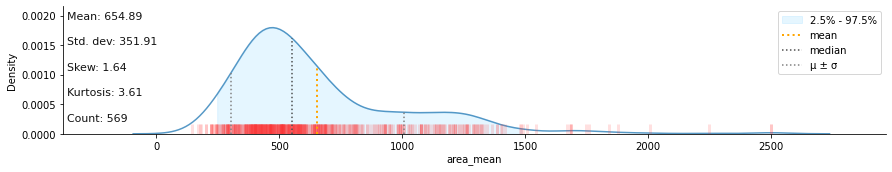

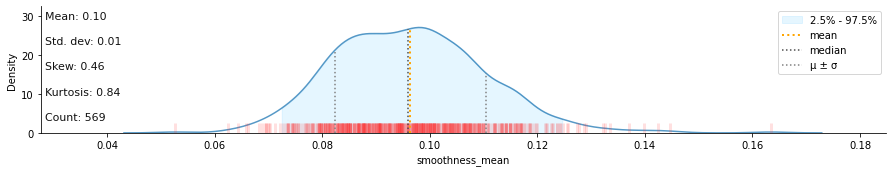

...

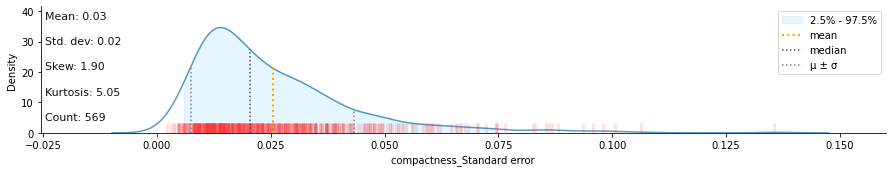

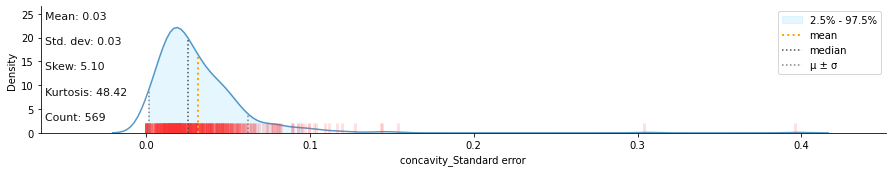

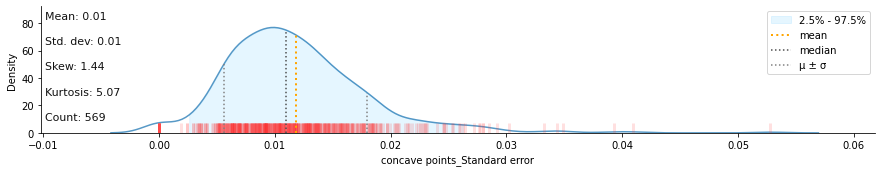

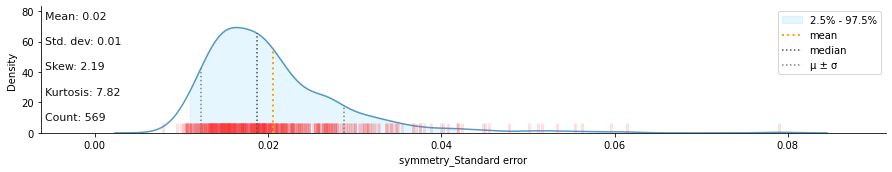

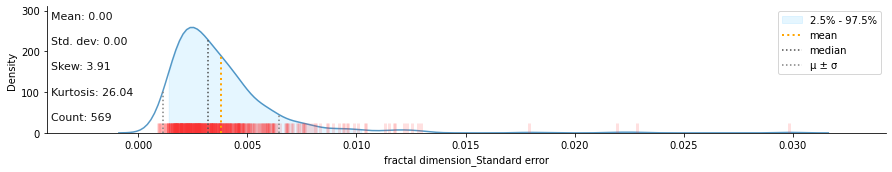

In [120]:
klib.dist_plot(breast_cancer_df[numerical_variables])

Insight:

Pada beberapa grafik, terdapat beberapa kurva yang mirip antara yang satu dengan yang lain. seperti bentuk kurva, puncak, dan persebarannya. Contoh field-fieldnya adalah sebagai berikut.

* Radius
* Perimeter
* Area
* Compactness
* Concavity
* Concave Points
* Texture (mean dan worst)
* Smoothness (worst)

Selain itu, sebagian besar variabel memiliki bentuk kurva yang kecil. Dapat dikatakan bahwa bisa saja terdapat outlier pada masing-masing variabel.

Box Plot - Comparison & Distribution

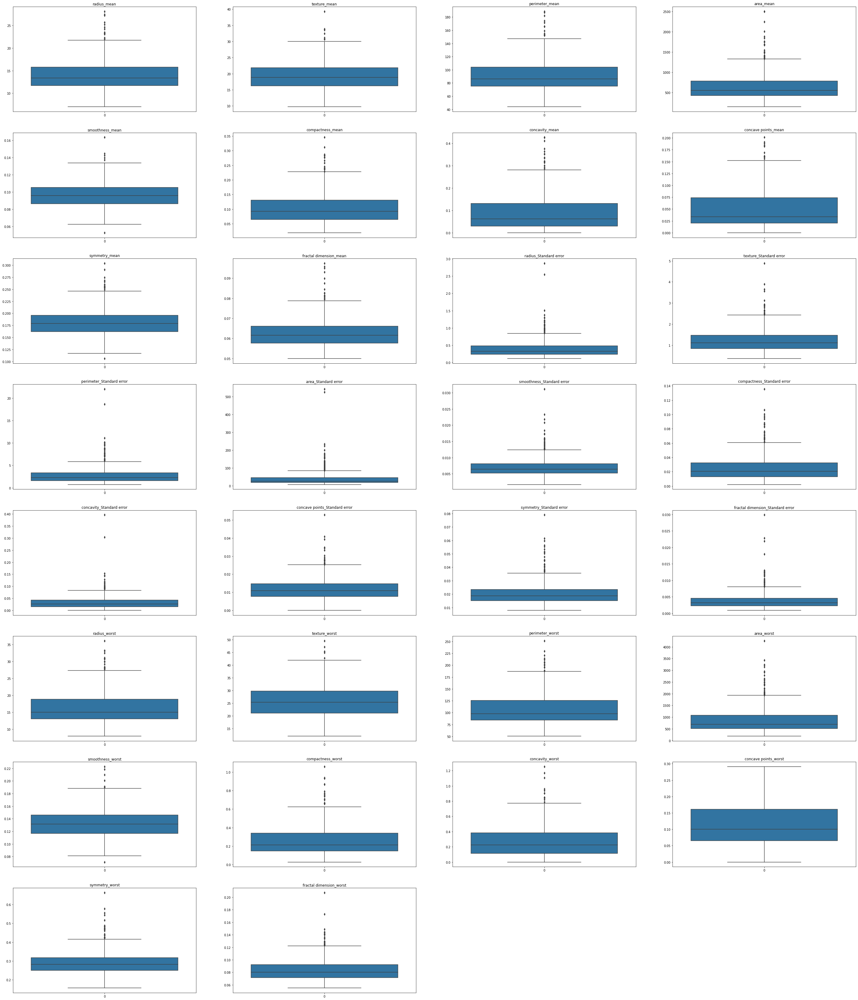

In [121]:
figure = get_plot_figure(50, 60)

for index, numerical_variable in enumerate(numerical_variables):
    plt.subplot(8, 4, index + 1)
    plt.xticks([])
    plt.title(numerical_variable)
    sns.boxplot(data = breast_cancer_df[numerical_variable])
plt.show()

**Insight:**

Sebagian besar variabel pada data terdapat banyak outlier. Lalu, distribusi variabel-variabel tersebut lebih condong ke kanan. Pada kasus ini. saya bisa menghapus outlier untuk menyeimbangkan kurva pada data.

### Two Variables

#### Categorical Variables

Multiple Bar Chart - Comparison

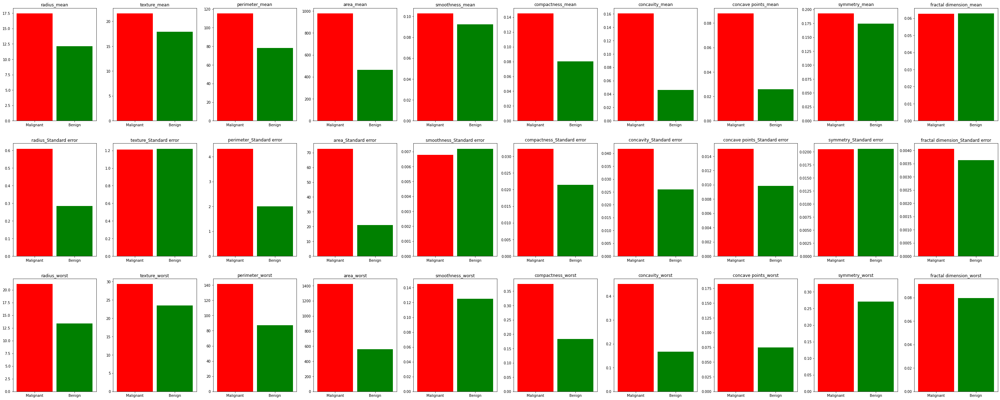

In [122]:
stacked_bar_chart_width = 0.9
survived_0_color = 'red'
survived_1_color = 'green'

figure = get_plot_figure(50, 20)

stacked_bar_fields = numerical_variables.copy()
stacked_bar_fields.append(diagnosis_field)

for index, field in enumerate(stacked_bar_fields):
    
    if field == diagnosis_field:
        continue

    plt.subplot(3, 10, index + 1)

    mean_malignant = breast_cancer_df.loc[breast_cancer_df[diagnosis_field] == 'M'].groupby(diagnosis_field)[field].mean()
    mean_benign = breast_cancer_df.loc[breast_cancer_df[diagnosis_field] == 'B'].groupby(diagnosis_field)[field].mean()

    unique_value_malignant = list(mean_malignant.index)[:5]
    unique_value_benign = list(mean_benign.index)[:5]

    plt.title(field)

    plt.xticks([0, 1], ['Malignant', 'Benign'])

    plt.bar(unique_value_malignant, mean_malignant, color = survived_0_color, width=stacked_bar_chart_width)
    plt.bar(unique_value_benign, mean_benign, color = survived_1_color, width=stacked_bar_chart_width)

plt.show()

**Insight:**

Pada beberapa variabel di atas, saya bisa melihat bahwa nilai pada malignant lebih besar daripada nilai benign pada beberapa variabel berikut.

* Radius
* Perimeter
* Area
* Compactness
* Concavity
* Concave Points
* Texture (mean dan worst)
* Smoothness (worst)

Maka dari itu, kemungkinan besar, terdapat beberapa relasi yang bisa didapatkan dari variabel-variabel tersebut terhadap variabel diagnosis.

Sebenarnya, beberapa variabel yang bernilai desimal seperti fractal_dimension mean dan , namun perbedaannya tidak terlalu signifikan karena mereka direpresentasikan dalam bentuk desimal. Dengan demikian, variabel-variabel tersebut dianggap hampir tidak memiliki perbedaan apapun.

#### Numerical Variables

Distribution Plot - Comparison & Distribution

mean


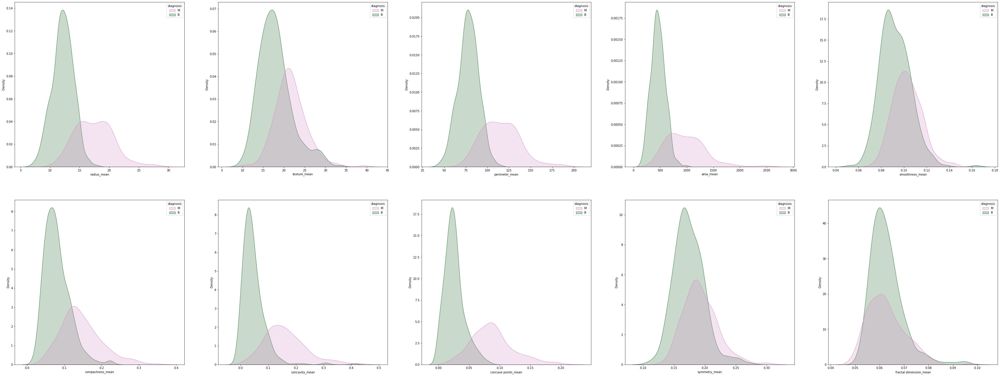

Standard error


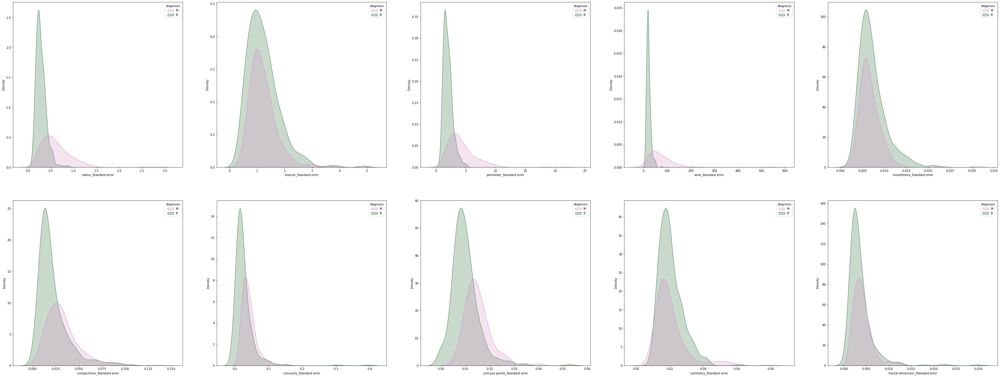

worst


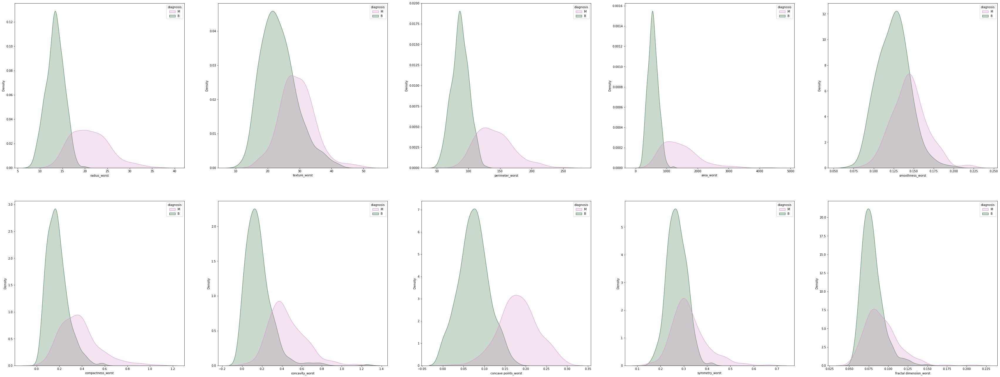

<Figure size 4320x4320 with 0 Axes>

In [123]:
figure = get_plot_figure(60, 60)

statistics_type_index = 0

for index, numerical_field in enumerate(numerical_variables):
    plt.subplot(5, 5, (index % 10) + 1)
    sns.kdeplot(x = breast_cancer_df[numerical_field], 
                hue = breast_cancer_df[diagnosis_field],
                palette='cubehelix_r',
                shade = True)

    if (index + 1) % 10 == 0:
        print(statistics_types[statistics_type_index])
        plt.show()
        figure = get_plot_figure(60, 60)
        statistics_type_index += 1

**Insight:**

Pada beberapa bagian di atas, terdapat beberapa kurva diagnosis yang perbedaan letak puncak dan letak persebaran bisa terlihat berbeda antara yang satu dengan yang lainnya, yaitu sebagai berikut.

* Radius
* Perimeter
* Area
* Compactness
* Concavity
* Concave Points

Maka dari itu, kemungkinan besar, terdapat beberapa relasi yang bisa didapatkan dari variabel-variabel tersebut terhadap variabel diagnosis.

### Multiple Variables

#### Numerical Variables

Pairplot - Relationship, Distribution & Comparison

Dalam kasus ini, saya akan membandingkan nilai-nilai antar satu statistika yang ada, karena apabila terlalu banyak fitur yang dikomparasikan, gambar akan menjadi sangat kecil. Pada akibatnya, kita akan sulit untuk mendapatkan insight dari gambar pairplot yang diberikan.

Dalam proyek ini, terdapat 2 tipe yang dibandingkan, yaitu sebagai berikut.

* Satu variabel antar variabel lainnya dalam satu statistik yang sama, misalnya area_mean dan texture_mean.
* Satu variabel antar variabel yang sama, namun berbeda statistik, misalnya area_mean dan area_Standard error.

mean


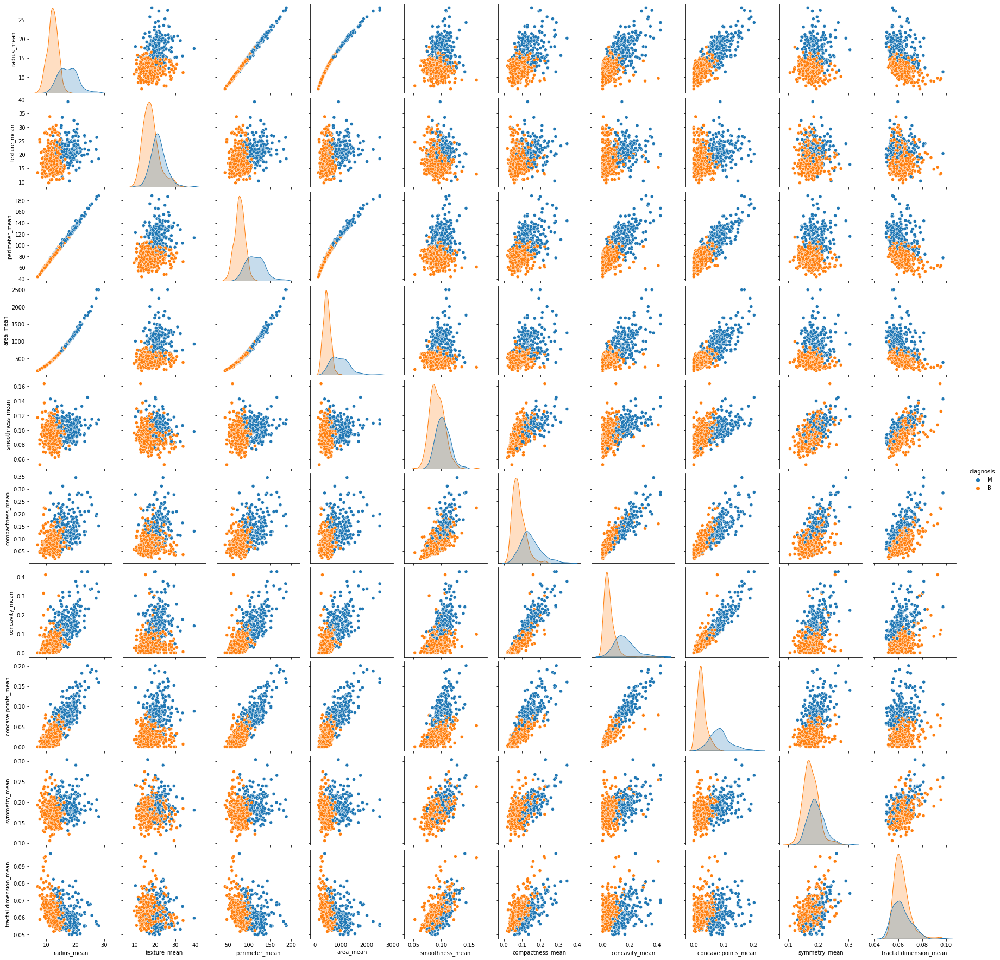

Standard error


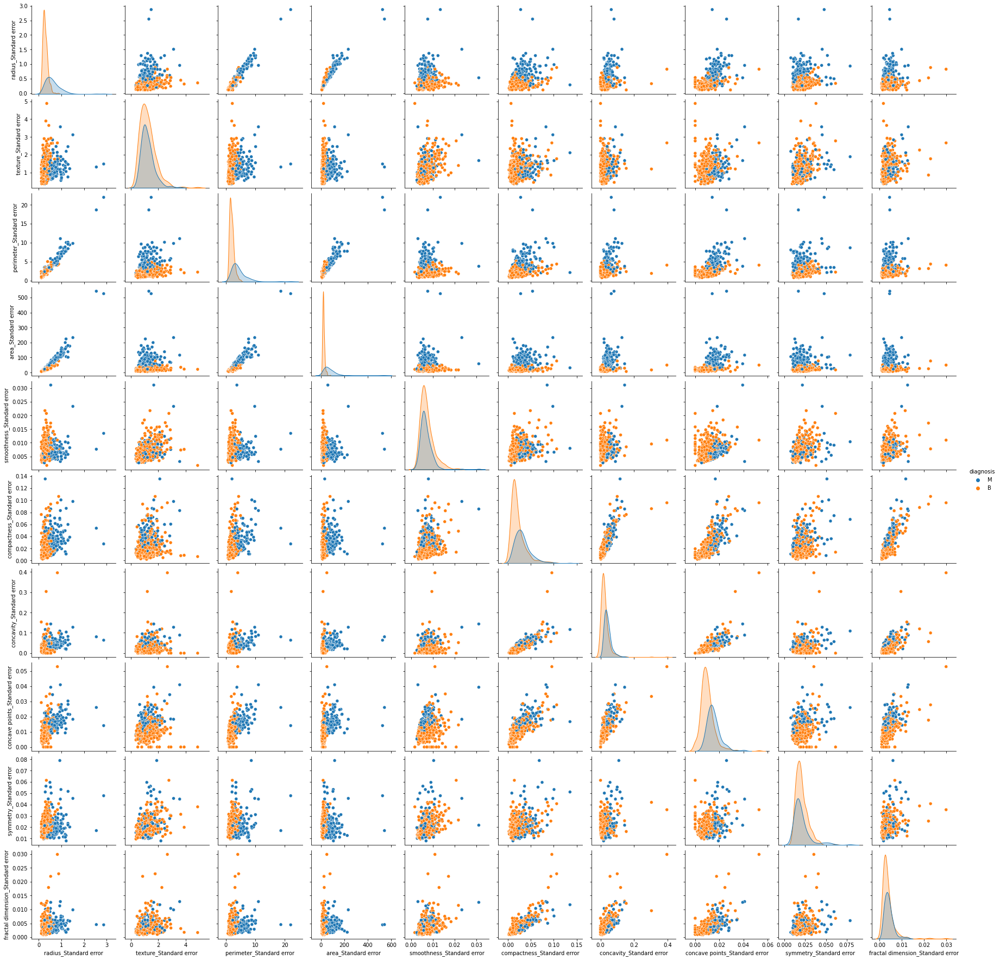

worst


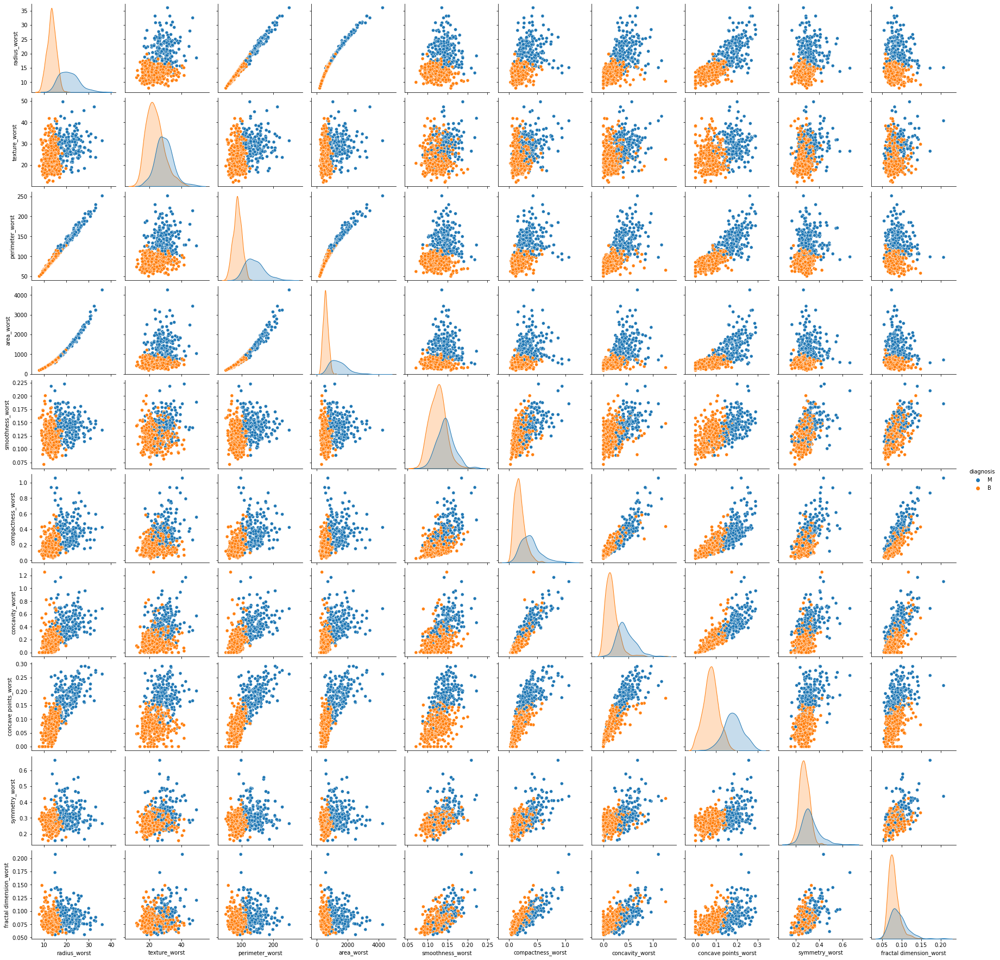

In [124]:
STATISTIC_INTERVAL = 10

for index, statistics_type in enumerate(statistics_types):
    print(statistics_types[index])
    statistic_columns = numerical_variables[index * STATISTIC_INTERVAL : (index + 1) * STATISTIC_INTERVAL]
    statistic_columns.append(diagnosis_field)

    sns.pairplot(data = breast_cancer_df[statistic_columns], hue = diagnosis_field)
    plt.show()

radius


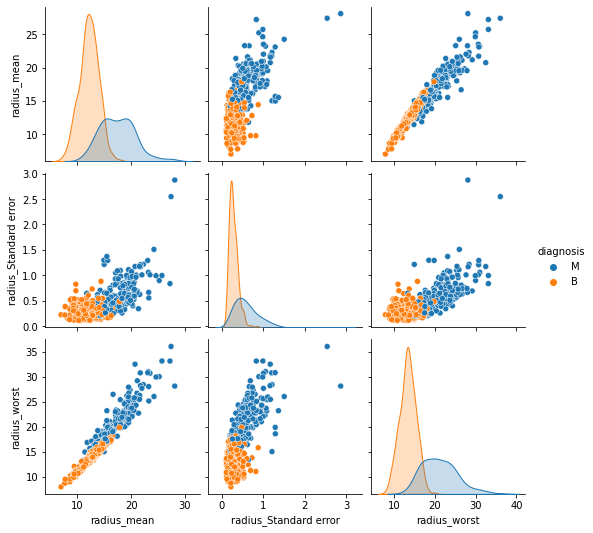

texture


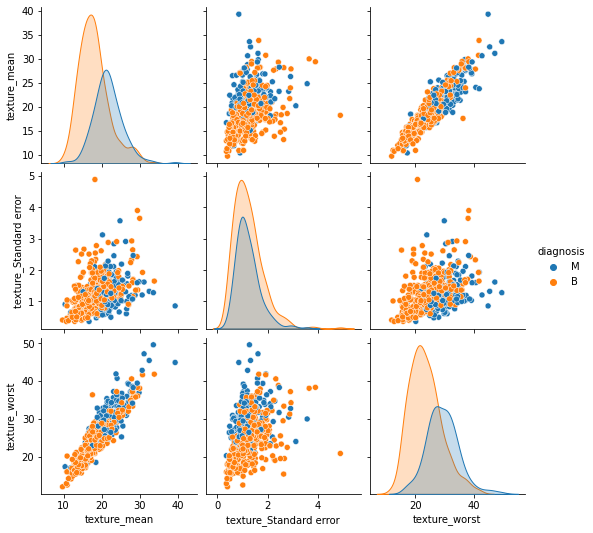

perimeter


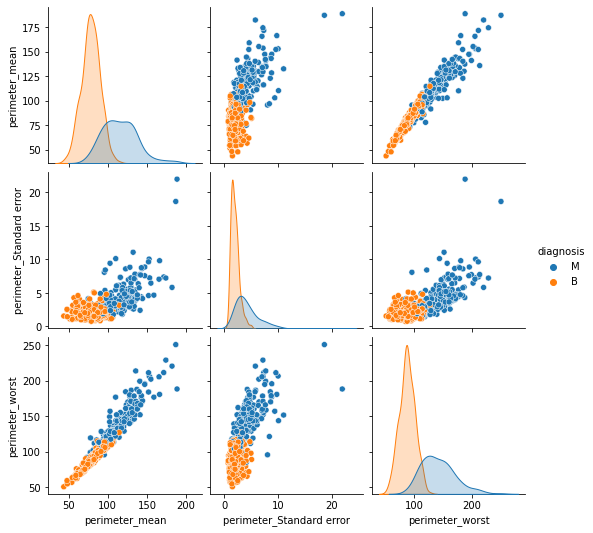

area


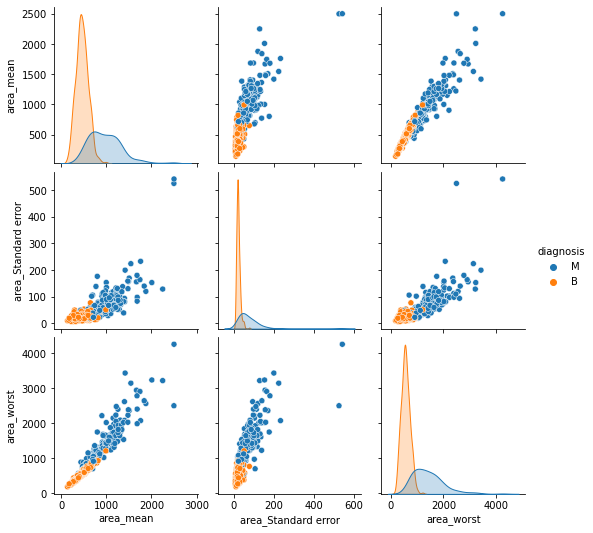

smoothness


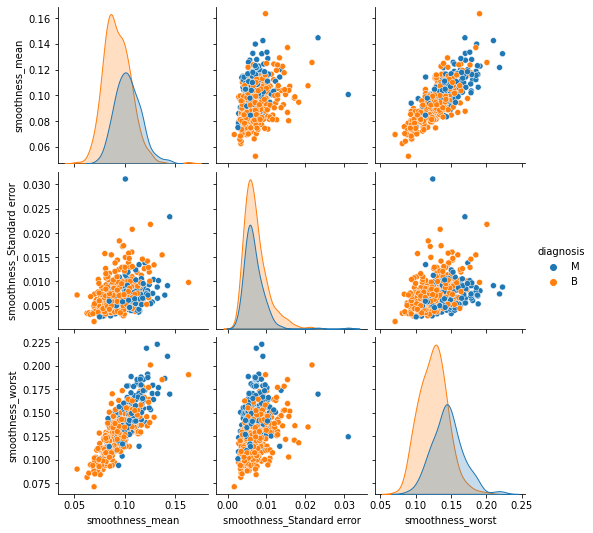

compactness


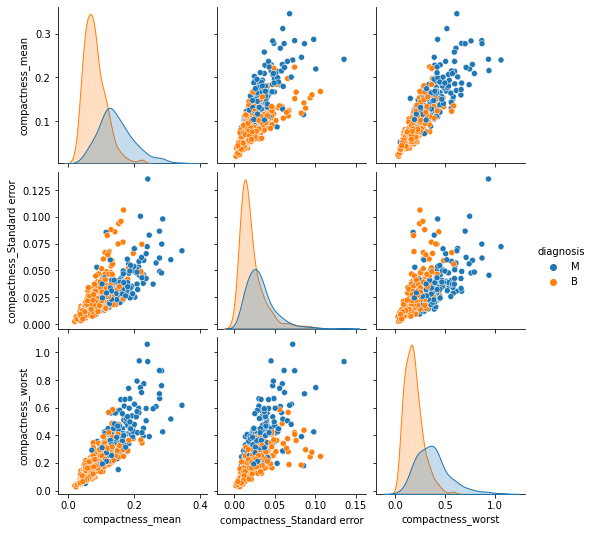

concavity


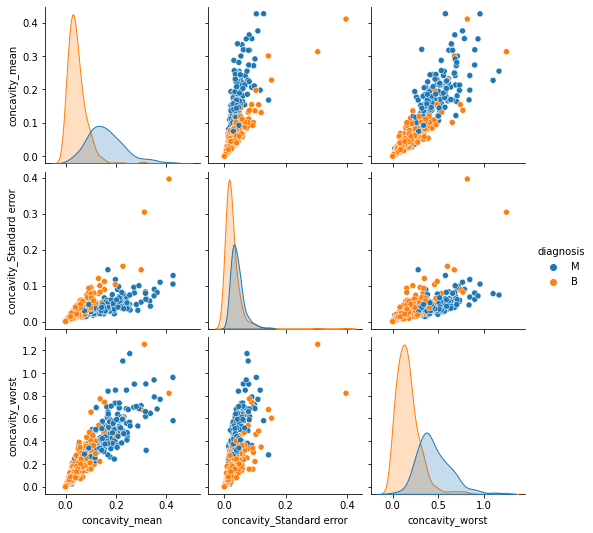

concave points


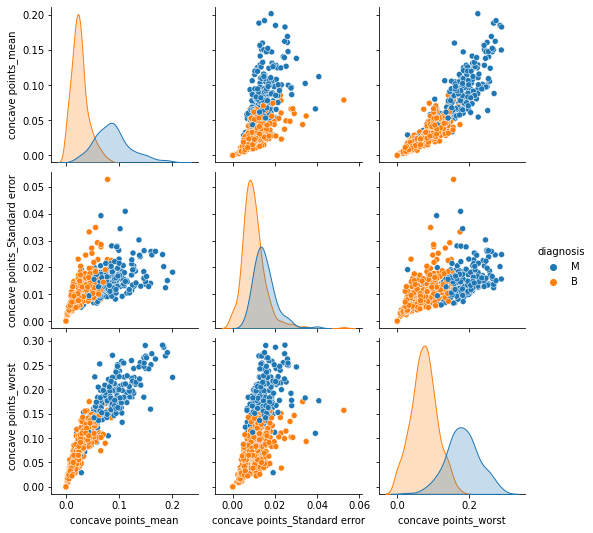

symmetry


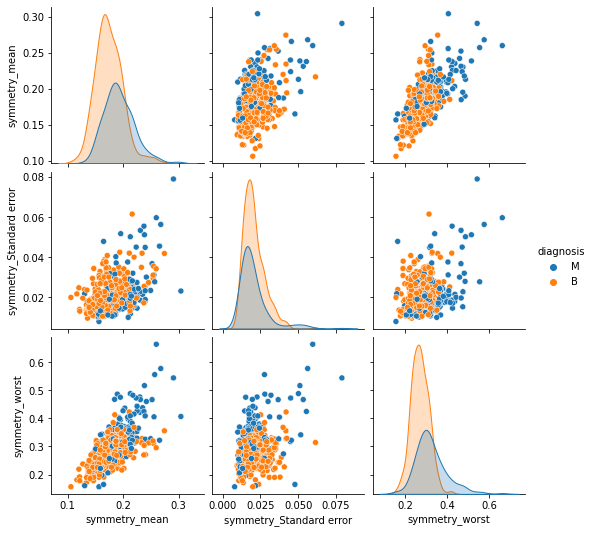

fractal dimension


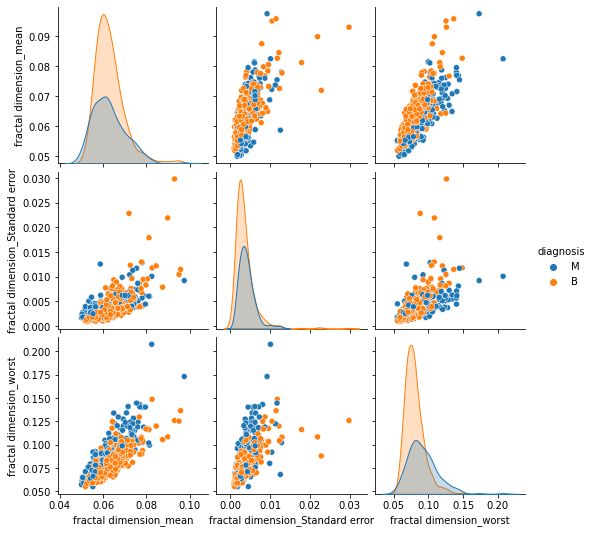

In [125]:
STANDARD_ERROR_INTERVAL = 10
WORST_INTERVAL = 20

for index, nucleus_property_name in enumerate(nucleus_property_names):

    mean_columns = numerical_variables[index]
    standard_error_columns = numerical_variables[index + STANDARD_ERROR_INTERVAL]
    worst_columns = numerical_variables[index + WORST_INTERVAL]
    
    statistic_columns = [mean_columns, standard_error_columns, worst_columns]
    statistic_columns.append(diagnosis_field)
    
    print(nucleus_property_name)
    sns.pairplot(data = breast_cancer_df[statistic_columns], hue = diagnosis_field)
    plt.show()

**Insight**: 

Dari grafik di atas, kita bisa mendapatkan insight sebagai berikut.

* Dari grafik komparasi antara variabel sama dengan statistik yang berbeda, sebagian besar variabel mean dan variabel worst memiliki korelasi yang tinggi.
* Dari grafik komparasi antar variabel dalam satu statistik: 
  * Variabel-variabel area, perimeter, dan radius memiliki korelasi yang tinggi.
  * Variabel-variabel concave, concavity_points, dan compactness memiliki korelasi yang tinggi.
  
* Pada semua variabel di atas, beberapa relasi antar variabel memiliki sedikit outlier.

Heatmap - Correlation/ Relationship

mean


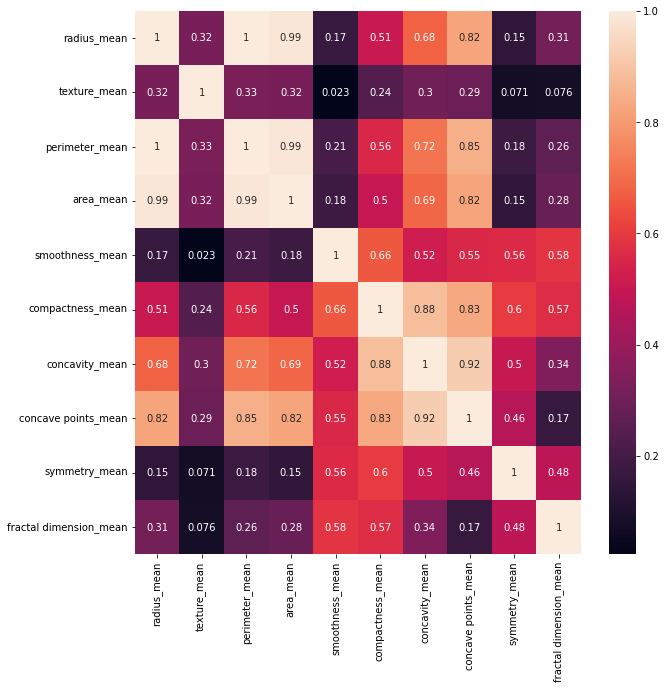

Standard error


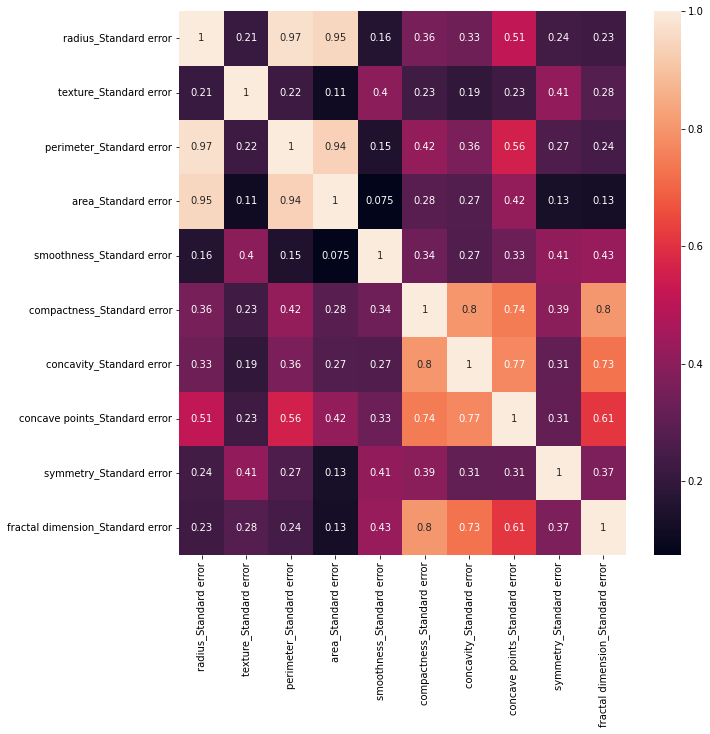

worst


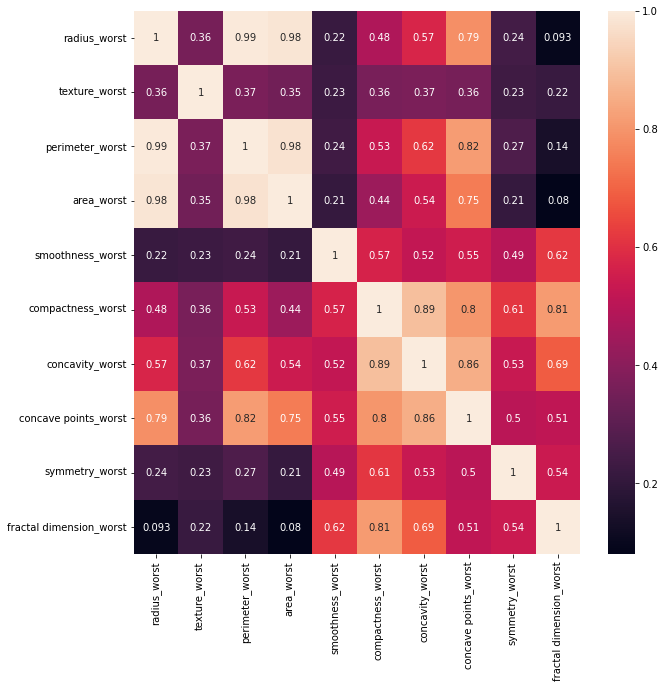

In [126]:
STATISTIC_INTERVAL = 10

for index, statistics_type in enumerate(statistics_types):
    
    statistic_columns = numerical_variables[index * STATISTIC_INTERVAL : (index + 1) * STATISTIC_INTERVAL]
    statistic_columns.append(diagnosis_field)

    print(statistics_types[index])
    
    plt.figure(figsize = (10, 10))
    sns.heatmap(data = np.abs(breast_cancer_df[statistic_columns].corr()), annot = True)
    plt.show()

radius


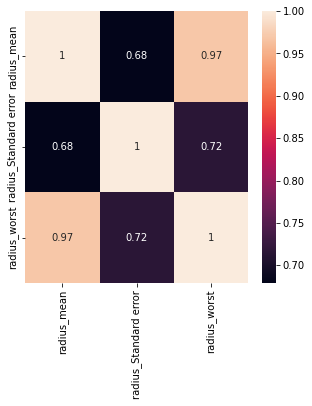

texture


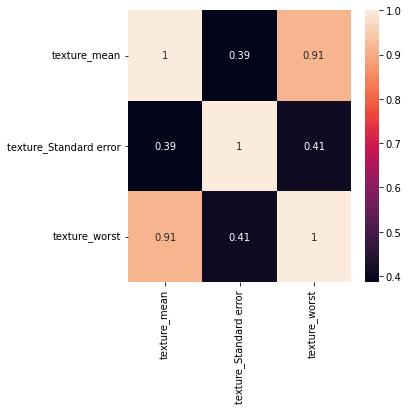

perimeter


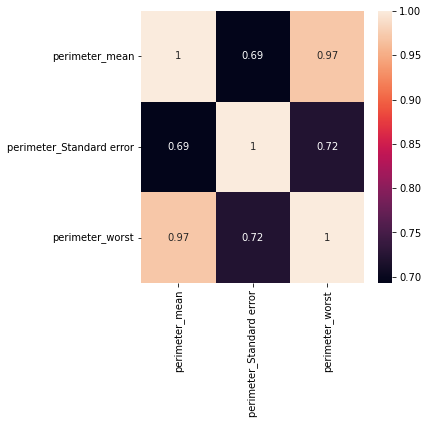

area


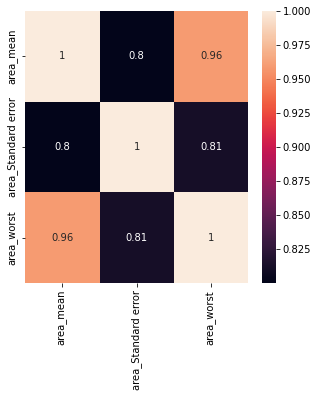

smoothness


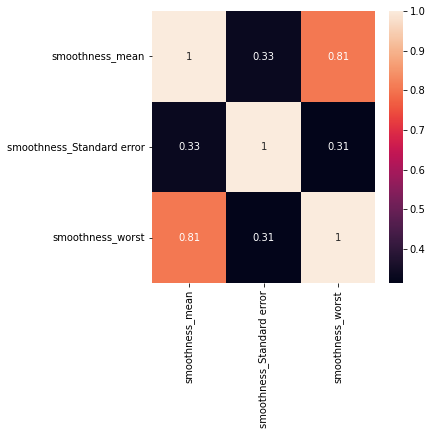

compactness


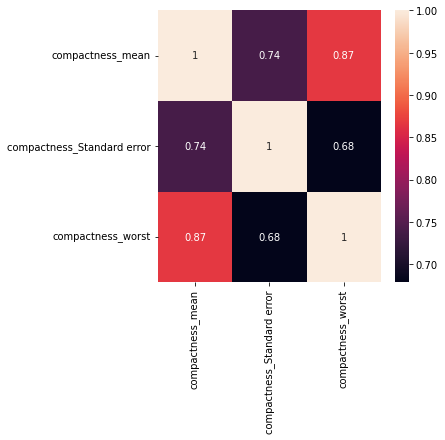

concavity


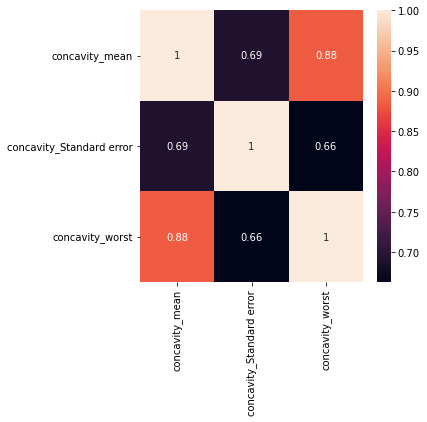

concave points


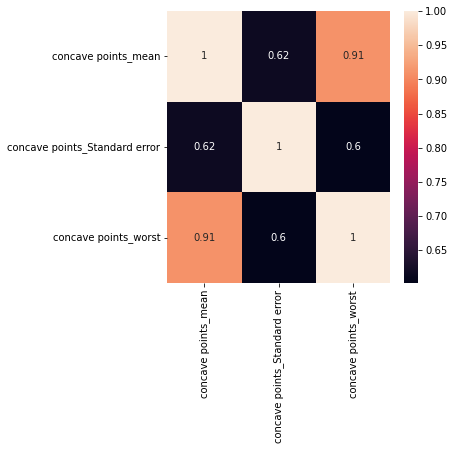

symmetry


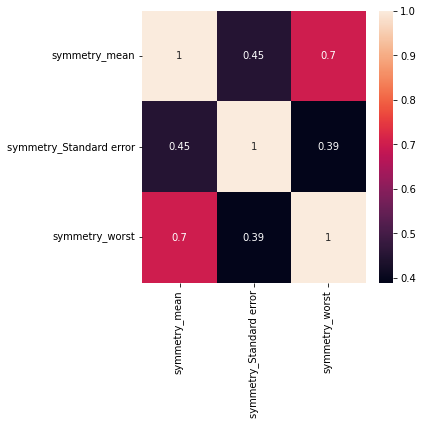

fractal dimension


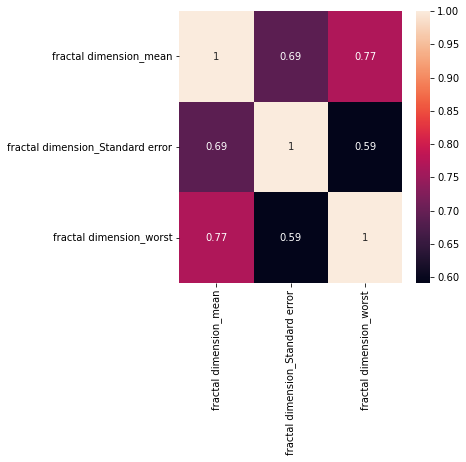

In [127]:
STANDARD_ERROR_INTERVAL = 10
WORST_INTERVAL = 20

for index, nucleus_property_name in enumerate(nucleus_property_names):

    mean_columns = numerical_variables[index]
    standard_error_columns = numerical_variables[index + STANDARD_ERROR_INTERVAL]
    worst_columns = numerical_variables[index + WORST_INTERVAL]
    
    statistic_columns = [mean_columns, standard_error_columns, worst_columns]

    print(nucleus_property_name)
    figure = plt.figure(figsize = (5, 5))
    sns.heatmap(breast_cancer_df[statistic_columns].corr(), annot = True)

    plt.show()

<AxesSubplot:>

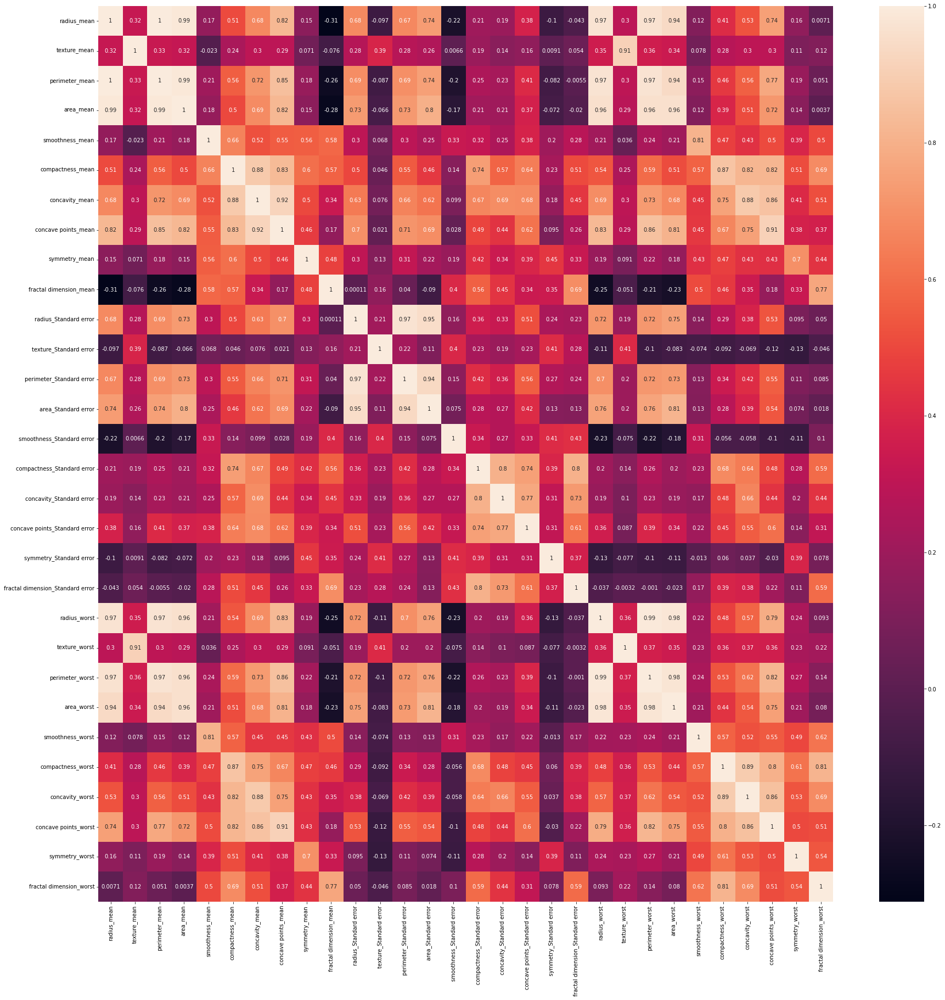

In [128]:
plt.figure(figsize=(30, 30))
sns.heatmap(breast_cancer_df[numerical_variables].corr(), annot = True)

**Insight:**

* Dari grafik heatmap antara variabel sama dengan statistik yang berbeda, sebagian besar variabel mean dan variabel worst memiliki korelasi yang tinggi.
  
* Dari grafik heatmap antar variabel dalam satu statistik: 
  * Variabel-variabel area, perimeter, dan radius memiliki korelasi yang tinggi.
  * Variabel-variabel concave, concavity_points, dan compactness memiliki korelasi yang tinggi.

* Dari grafik heatmap semua variabel:
  * Baik secara mean, standard error, dan worst: area, perimeter, dan radius saling berkorelasi tinggi.
  * Baik secara mean, standard error, dan worst: concavity, compactness, dan concave points saling berkorelasi tinggi.

## Data Preprocessing

### Removing Outlier

**Z-Score**

Secara singkat, Z Score adalah suatu teknik statistika untuk melihat seberapa dekatnya satu angka pada fitur terhadap rata-rata dari suatu kumpulan angka-angka pada fitur.

Untuk lebih jelasnya, perhatikan contoh gambar berikut.

![Gambar pada Z-Score](https://www.investopedia.com/thmb/cTLmW4BN4TGe8UizdDPTi1ld-i8=/1431x1073/smart/filters:no_upscale()/Z-dc7881981d5b4ab5a8765f2a293c9552.png)

Sumber: https://www.investopedia.com/thmb/cTLmW4BN4TGe8UizdDPTi1ld-i8=/1431x1073/smart/filters:no_upscale()/Z-dc7881981d5b4ab5a8765f2a293c9552.png

Dari gambar di atas, perhatikan lingkaran merah tersebut. Di atas, ia menjelaskan bahwa semakin besar nilai Z score, baik secara negatif atau positif, data tersebut akan semakin menjauh dari mean. Nilai z score yang tinggi juga menunjukkan outlier, karena nilai outlier akan tentu jauh berbeda nilainya dari nilai rata-rata.

Teknik Z Score ini lebih ramah dibandingkan dengan IQR Method. Hal ini disebabkan karena kita bisa bebas mengatur parameter Z Score yang ingin kita pertahankan datanya.

In [129]:
breast_cancer_z_selection = breast_cancer_df.copy()

In [130]:
def threshold(z_score_data, original_data, min_threshold, max_threshold, increment_threshold):
    for z_score in np.arange(min_threshold, max_threshold, increment_threshold):
        data = original_data.copy()
        data = data[(z_score_data < z_score).all(axis = 1)]
        loss = (original_data.shape[0] - data.shape[0]) / original_data.shape[0] * 100
        print(f'With threshold {np.round(z_score, 1)}, data loss is: {np.round(loss, 2)}%')

In [131]:
z_score_columns = numerical_variables.copy()

z_score = np.abs(zscore(breast_cancer_z_selection[z_score_columns]))
threshold(z_score, breast_cancer_z_selection[z_score_columns], 1, 8, 0.2)

With threshold 1.0, data loss is: 92.62%
With threshold 1.2, data loss is: 79.44%
With threshold 1.4, data loss is: 63.97%
With threshold 1.6, data loss is: 52.02%
With threshold 1.8, data loss is: 41.65%
With threshold 2.0, data loss is: 32.86%
With threshold 2.2, data loss is: 27.24%
With threshold 2.4, data loss is: 21.44%
With threshold 2.6, data loss is: 18.1%
With threshold 2.8, data loss is: 15.29%
With threshold 3.0, data loss is: 13.01%
With threshold 3.2, data loss is: 10.72%
With threshold 3.4, data loss is: 9.14%
With threshold 3.6, data loss is: 7.73%
With threshold 3.8, data loss is: 6.68%
With threshold 4.0, data loss is: 5.98%
With threshold 4.2, data loss is: 5.27%
With threshold 4.4, data loss is: 4.39%
With threshold 4.6, data loss is: 3.69%
With threshold 4.8, data loss is: 2.99%
With threshold 5.0, data loss is: 2.46%
With threshold 5.2, data loss is: 2.46%
With threshold 5.4, data loss is: 2.28%
With threshold 5.6, data loss is: 2.11%
With threshold 5.8, data loss

Hapus outlier dari threshold yang diberikan.

Perlu diperhatikan, jumlah data yang ingin kita hapus harus dilihat juga dari jumlah data yang kita punya. Jangan menggunakan threshold yang kecil jika data yang kita punya sangat sedikit.

In [132]:
breast_cancer_no_outlier_df = breast_cancer_z_selection[(z_score < 3.2).all(axis = 1)]
print("Before Clean Outlier:", breast_cancer_z_selection.shape[0])
print("After Clean Outlier:", breast_cancer_no_outlier_df.shape[0])

Before Clean Outlier: 569
After Clean Outlier: 508


Menggunakan Box Plotting untuk melihat outlier sekarang.

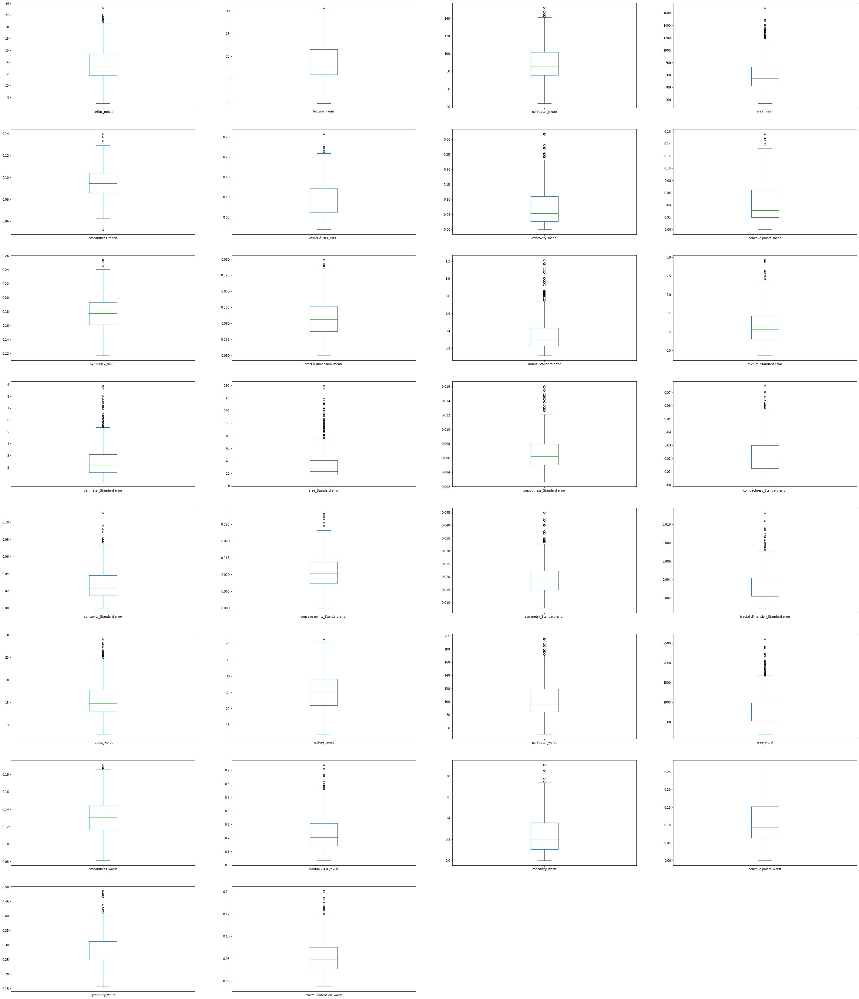

In [133]:
breast_cancer_no_outlier_df[z_score_columns].plot(kind = 'box', subplots = True, layout = (8, 4), figsize = (50, 60))
plt.show()

### Oversampling Technique

Perhatikan jumlah data malignant dan benign pada box plot - comparison. Apabila kita lihat, jumlah data belignant lebih banyak daripada data malignant.

Dalam kasus kita, terdapat total 569 data. Ingatlah bahwa data itu emas. Jika kita melakukan undersampling, maka kita akan kehilangan banyak sekali informasi pada belignant. Maka dari itu, pada hal ini, kita akan mencoba untuk melakukan oversampling.

Dalam proyek ini, saya akan menggunakan teknik random oversampling. Teknik Oversampling adalah teknik yang digunakan untuk melakukan penambahan data kelas minoritas secara acak dengan cara duplikasi.

In [134]:
breast_cancer_ros = breast_cancer_no_outlier_df.copy()

In [135]:
random_over_sample = RandomOverSampler(sampling_strategy = 'minority')

x_breast_cancer_ros, y_breast_cancer_ros = random_over_sample.fit_resample(
    breast_cancer_ros[feature_variables], 
    breast_cancer_ros[target_variables]
)

Counter(y_breast_cancer_ros)

Counter({'M': 336, 'B': 336})

### Train Test Split

Kita akan melakukan pembagian dataset terlebih dahulu. Hal ini bertujuan agar kita bisa mengukur accuracy dengan data yang belum pernah dipelajari.

Dalam dataset ini, saya akan coba menggunakan 80% train dan 20% test. Maka dari itu, kita memiliki 537 data latih dan 135 data uji.

In [136]:
x_original_data = x_breast_cancer_ros.copy()
y_original_data = y_breast_cancer_ros.copy()

In [137]:
x_train, x_test, y_train, y_test = train_test_split(
    x_original_data,
    y_original_data,
    test_size = 0.2,
    random_state = 100
)

print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(537, 30)
(135, 30)
(537,)
(135,)


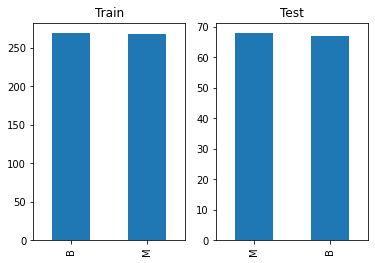

In [138]:
fig, axes = plt.subplots(nrows = 1, ncols = 2)

y_train.value_counts().plot(kind = 'bar', ax = axes[0], title = "Train")
y_test.value_counts().plot(kind = 'bar', ax = axes[1], title = "Test")

plt.show()

### Feature Extraction

Dalam proyek ini, saya akan menggunakan PCA sebagai feature extraction.

PCA adalah singkatan dari Principal Component Analysis. Principal component analysis bertujuan untuk mentransformasikan data dengan mengubah dimensi fitur-fitur yang ada menjadi dimensi yang lebih kecil lagi. Ia mereduksi dimensi dengan memiliki variance maksimal, yaitu rata-rata jarak kuadrat dari poin-poin yang telah diproyeksi dengan garis lurus ke titik asal.

Saat teknik ini diterapkan, hanya komponen utama yang akan digunakan. Inilah yang dimaksud dengan Principal Component (PC). Jika data-data pada fitur berkorelasi linear, maka kita hanya menggunakan PC pertama saja. PC kedua dan seterusnya merupakan sisa informasi-informasi yang tidak didapatkan pada data pertama. Dalam sklearn. kita bisa menggunakan atribut score untuk melihat nilai PCA.

Dari plotting di atas, terdapat banyak sekali variabel-variabel yang berkolinearitas tinggi. Hal ini selaras dengan nilai VIF pada tahap sebelumnya. Maka dari itu, ini menjadi peluang untuk melakukan salah satu teknik dimensionality reduction, yaitu PCA.

In [139]:
x_train_feature_extraction = x_train.copy()
x_test_feature_selection = x_test.copy()

Melakukan list fitur-fitur yang akan di-PCA-kan

In [140]:
feature_extraction_areas = [area_field, perimeter_field, radius_field]
feature_extraction_concave = [compactness_field, concavity_field, concave_points]

selected_statistics_types = [worst_field, mean_field, standard_error_field]

statistics_feature_extraction_areas = []
statistics_feature_extraction_concave = []

for nucleus_index, statistics_type in enumerate(selected_statistics_types):
    for nucleus_property_index, nucleus_property in enumerate(feature_extraction_areas):
        statistics_feature_extraction_areas.append(f"{nucleus_property}_{statistics_type}")

    for nucleus_property_index, nucleus_property in enumerate(feature_extraction_concave):
        statistics_feature_extraction_concave.append(f"{nucleus_property}_{statistics_type}")

print(statistics_feature_extraction_areas)
print(statistics_feature_extraction_concave)

['area_worst', 'perimeter_worst', 'radius_worst', 'area_mean', 'perimeter_mean', 'radius_mean', 'area_Standard error', 'perimeter_Standard error', 'radius_Standard error']
['compactness_worst', 'concavity_worst', 'concave points_worst', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'compactness_Standard error', 'concavity_Standard error', 'concave points_Standard error']


In [141]:
feature_extraction_textures = [texture_field]
selected_statistics_types = [mean_field, worst_field]
statistics_feature_extraction_texture = []

for nucleus_index, statistics_type in enumerate(selected_statistics_types):
    for nucleus_property_index, nucleus_property in enumerate(feature_extraction_textures):
        statistics_feature_extraction_texture.append(f"{nucleus_property}_{statistics_type}")

print(statistics_feature_extraction_texture)

['texture_mean', 'texture_worst']


Di sini, kita akan coba untuk melakukan teknik PCA sebanyak 2 kali, yaitu pada field-field sebagai berikut.

* Area, Perimeter, dan Radius (worst dan mean)
* Concavity, Compactness, dan Concave Points (worst dan mean)

In [142]:
pca_model_area = PCA(n_components=1)
pca_model_concave_point = PCA(n_components=1)
pca_model_texture = PCA(n_components=1)

x_train_pca = x_train.copy()
x_test_pca = x_test.copy()

x_train_pca[pca_area_field] = pca_model_area.fit_transform(x_train[statistics_feature_extraction_areas]).flatten()
x_test_pca[pca_area_field] = pca_model_area.transform(x_test[statistics_feature_extraction_areas]).flatten()

x_train_pca[pca_concave_field] = pca_model_concave_point.fit_transform(
    x_train[statistics_feature_extraction_concave]
).flatten()

x_test_pca[pca_concave_field] = pca_model_concave_point.transform(
    x_test[statistics_feature_extraction_concave],
).flatten()

x_train_pca[pca_texture_field] = pca_model_texture.fit_transform(
    x_train[statistics_feature_extraction_texture]
).flatten()

x_test_pca[pca_texture_field] = pca_model_texture.transform(
    x_test[statistics_feature_extraction_texture],
).flatten()

print(f"Area Variance Ratio: {np.round(pca_model_area.explained_variance_ratio_, 2)}")
print(f"Concave Variance Ratio: {np.round(pca_model_concave_point.explained_variance_ratio_, 2)}")
print(f"Texture Variance Ratio: {np.round(pca_model_texture.explained_variance_ratio_, 2)}")

Area Variance Ratio: [0.98]
Concave Variance Ratio: [0.91]
Texture Variance Ratio: [0.96]


Melakukan drop untuk field-field sebelum diproses menggunakan PCA.

In [143]:
x_train_pca.drop(statistics_feature_extraction_areas, axis = 1, inplace = True)
x_train_pca.drop(statistics_feature_extraction_concave, axis = 1, inplace = True)
x_train_pca.drop(statistics_feature_extraction_texture, axis = 1, inplace = True)

x_train_pca

,smoothness_mean,symmetry_mean,fractal dimension_mean,texture_Standard error,smoothness_Standard error,symmetry_Standard error,fractal dimension_Standard error,smoothness_worst,symmetry_worst,fractal dimension_worst,Area,Concave,Texture
152,0.10060,0.1566,0.06669,1.8050,0.014960,0.03082,0.004785,0.1216,0.1902,0.07313,-631.861236,-0.332989,-10.361367
355,0.09495,0.1735,0.05875,0.6372,0.003958,0.01500,0.001621,0.1206,0.2778,0.07012,63.325062,-0.111822,-7.978760
159,0.09059,0.1167,0.06217,1.1080,0.007356,0.02165,0.004784,0.1121,0.1811,0.07427,-555.862117,-0.176564,-9.512020
586,0.09383,0.2094,0.05581,1.1860,0.006804,0.01897,0.004045,0.1353,0.3070,0.08255,1197.266902,0.113844,3.274931
666,0.09491,0.1782,0.05976,0.7476,0.005839,0.01467,0.003121,0.1435,0.3019,0.09124,164.432702,0.282020,-5.619633
...,...,...,...,...,...,...,...,...,...,...,...,...,...
578,0.09872,0.1950,0.06466,0.6509,0.004044,0.01522,0.001976,0.1552,0.4753,0.10130,62.332073,0.251033,3.767124
53,0.12430,0.1828,0.06757,2.0670,0.011930,0.03357,0.003048,0.1639,0.2972,0.07712,-815.959399,-0.245555,1.621079
350,0.08872,0.1601,0.05541,1.0450,0.006175,0.01096,0.001857,0.1374,0.2460,0.07262,-430.375808,-0.204709,-9.696333
79,0.09200,0.1717,0.06097,0.8413,0.009882,0.02471,0.002142,0.1257,0.2556,0.06828,-73.798853,-0.026971,1.605485


In [144]:
x_test_pca.drop(statistics_feature_extraction_areas, axis = 1, inplace = True)
x_test_pca.drop(statistics_feature_extraction_concave, axis = 1, inplace = True)
x_test_pca.drop(statistics_feature_extraction_texture, axis = 1, inplace = True)

x_test_pca

,smoothness_mean,symmetry_mean,fractal dimension_mean,texture_Standard error,smoothness_Standard error,symmetry_Standard error,fractal dimension_Standard error,smoothness_worst,symmetry_worst,fractal dimension_worst,Area,Concave,Texture
268,0.07005,0.1788,0.06833,1.3050,0.007389,0.02701,0.002153,0.09861,0.2991,0.07804,-793.678715,-0.386941,-7.824846
105,0.10540,0.1966,0.06213,1.5810,0.008102,0.02045,0.004570,0.15030,0.2894,0.08456,723.648086,0.034892,-2.296399
54,0.10490,0.1949,0.07292,1.2680,0.009407,0.01700,0.006113,0.16400,0.2844,0.11320,-5.895998,0.557783,4.326068
191,0.10610,0.1910,0.06908,1.2170,0.007899,0.02637,0.003761,0.14060,0.3055,0.08797,-681.129466,-0.275853,-3.786102
299,0.10330,0.1776,0.06907,0.8225,0.007416,0.02348,0.002917,0.14180,0.3301,0.09080,-594.214695,-0.087523,-7.656837
...,...,...,...,...,...,...,...,...,...,...,...,...,...
660,0.09258,0.1761,0.06130,1.0050,0.004088,0.01323,0.001465,0.14710,0.3470,0.07900,-140.605001,0.062973,10.838158
267,0.08511,0.1632,0.05894,0.5735,0.003632,0.01344,0.002585,0.11280,0.2651,0.08385,-340.313130,-0.340130,-6.723030
384,0.09136,0.1861,0.06347,0.7693,0.005910,0.02223,0.002378,0.12140,0.3313,0.07735,-362.897199,-0.259354,-1.391518
580,0.10240,0.1647,0.06464,1.5060,0.010520,0.02120,0.004867,0.16600,0.2654,0.09438,108.283708,0.082933,9.402389


### ANOVA Feature Selection

Dalam kasus ini, saya akan menggunakan ANOVA untuk melakukan feature selection.

ANOVA adalah salah satu algoritma untuk melakukan analisis variance. Variance adalah nilai informasi yang terdapat pada atribut yang ada. Tujuan dari analisis variance ini adalah agar rata-rata dari dua atau lebih sampel data berasal dari distribusi yang sama. ANOVA menggunakan kalkulasi F-Statistic, yaitu suatu tes statistika yang digunakan untuk menghitung kalkulasi rasio antar variance. ANOVA cocok digunakan pada data-data yang relasinya linear.

ANOVA ini digunakan ketika ada satu variabel numerik dan satu variabel kategorikal. Hasil akhir dari tes ini digunakan untuk menghapus fitur-fitur yang tidak berkorelasi antar variabel kategorikal yang ditentukan. Untuk melakukan pengecekan terhadap prioritas-prioritas fitur-fitur yang ada, kita bisa menggunakan library Sklearn SelectKBest untuk mengecek skor-skor dari masing-masing fitur.

In [145]:
breast_cancer_normalized_data = x_train_pca.copy()
breast_cancer_normalized_data_columns = x_train_pca.columns.to_list()
breast_cancer_normalized_data_columns

['smoothness_mean',
 'symmetry_mean',
 'fractal dimension_mean',
 'texture_Standard error',
 'smoothness_Standard error',
 'symmetry_Standard error',
 'fractal dimension_Standard error',
 'smoothness_worst',
 'symmetry_worst',
 'fractal dimension_worst',
 'Area',
 'Concave',
 'Texture']

Melakukan Standard Scaler terlebih dahulu

In [146]:
standard_scaler = StandardScaler()
breast_cancer_normalized_data[breast_cancer_normalized_data_columns] = standard_scaler.fit_transform(
    breast_cancer_normalized_data[breast_cancer_normalized_data_columns]
)
breast_cancer_normalized_data

,smoothness_mean,symmetry_mean,fractal dimension_mean,texture_Standard error,smoothness_Standard error,symmetry_Standard error,fractal dimension_Standard error,smoothness_worst,symmetry_worst,fractal dimension_worst,Area,Concave,Texture
152,0.311564,-0.989201,0.867724,1.386598,3.582052,1.955997,0.837318,-0.586808,-1.827804,-0.670381,-1.099403,-1.337915,-1.531027
355,-0.133662,-0.286505,-0.534782,-1.109423,-1.158079,-0.671362,-1.132440,-0.633546,-0.257647,-0.857026,0.110182,-0.449289,-1.178966
159,-0.477235,-2.648230,0.069320,-0.103149,0.305924,0.433059,0.836695,-1.030817,-1.990913,-0.599691,-0.967169,-0.709417,-1.405525
586,-0.221920,1.206205,-1.054098,0.063566,0.068099,-0.012031,0.376629,0.053499,0.265738,-0.086262,2.083178,0.457415,0.483914
666,-0.136815,-0.091080,-0.356378,-0.873457,-0.347664,-0.726168,-0.198610,0.436748,0.174325,0.452590,0.286104,1.133124,-0.830374
...,...,...,...,...,...,...,...,...,...,...,...,...,...
578,0.163418,0.607458,0.509148,-1.080141,-1.121027,-0.634824,-0.911433,0.983579,3.282374,1.076394,0.108454,1.008622,0.556642
53,2.179150,0.100186,1.023165,1.946589,2.276598,2.412712,-0.244057,1.390198,0.090081,-0.422967,-1.419724,-0.986613,0.239536
350,-0.624593,-0.843672,-1.124753,-0.237803,-0.202901,-1.342318,-0.985517,0.151648,-0.827636,-0.702005,-0.748830,-0.822500,-1.432759
79,-0.366126,-0.361348,-0.142646,-0.673186,1.394233,0.941258,-0.808090,-0.395184,-0.655564,-0.971121,-0.128406,-0.108365,0.237231


C:\Users\user\AppData\Local\Temp\ipykernel_17496\3249085784.py:13: UserWarning:

FixedFormatter should only be used together with FixedLocator



<BarContainer object of 13 artists>

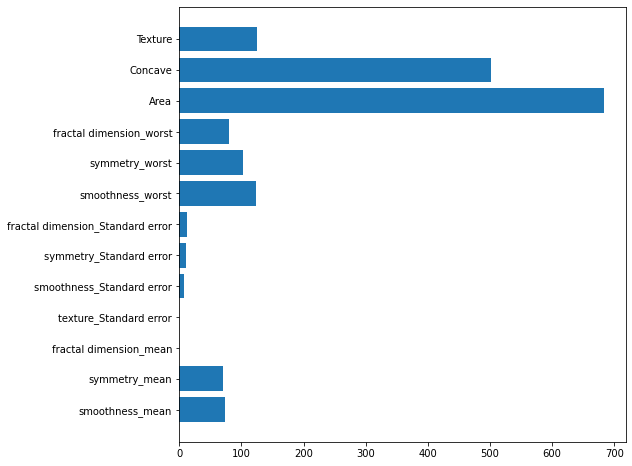

In [147]:
breast_cancer_ANOVA = SelectKBest(score_func = f_classif, k = 10)

feature_importance_ANOVA = breast_cancer_ANOVA.fit_transform(
    breast_cancer_normalized_data[breast_cancer_normalized_data_columns],
    y_train
)

fig, ax = plt.subplots(1, 1)

fig.set_figwidth(8)
fig.set_figheight(8)

ax.set_yticklabels([breast_cancer_normalized_data_columns[feature_index] for feature_index in range(len(breast_cancer_ANOVA.scores_))])
ax.set_yticks([feature_index for feature_index in range(len(breast_cancer_ANOVA.scores_))])

ax.barh(
    y = [feature_index for feature_index in range(len(breast_cancer_ANOVA.scores_))],
    width = breast_cancer_ANOVA.scores_
)

Dari hasil plotting di atas, kita bisa melihat bahwa fitur-fitur yang memiliki korelasi tinggi dengan field diagnosis adalah sebagai berikut.

* Area
* Concave
* Texture
* Smoothness_worst

Dari hasil field-field yang kita pilih, area, concave, texture, smoothness_worst memiliki peran esensial dalam menentukan breast cancer ganas atau jinak. Maka dari itu, kita bisa mengambil field-field yang paling berperan dari hasil ANOVA di atas.

### Random Forest Feature Selection

Random Forest merupakan bagian dari Decision Tree. Sebelum kita menjelaskan Random Forest, kita akan mengetahui decision tree terlebih dahulu.

**Decision Tree:**

Decision Tree adalah suatu algoritma machine learning yang termasuk ke bagian tree based algorithm. Tree based algortihm ini merupakan suatu algoritma machine learning yang menggunakan konsep pohon untuk membuat keputusan dari data-data yang ada.

Berikut adalah langkah-langkah pembuatan decision tree:

1. Dalam algoritma decision tree, cara membuat cabang-cabang keputusan adalah dengan menggunakan entropy. Rumus entropy: $H(x) = -\sum_{i=1}^n p(x_i) \log_2 p(x_i)$.

2. Entropi ini akan digunakan pada awal perhitungan jumlah label/ target. Dengan nilai entropi per label, kita akan menghitung nilai entropi suatu fitur terhadap target yang ada. Cara mendapatkan nilai tersebut adalah dengan menjumlah setiap nilai unik pada suatu fitur, dengan mengalikan probabilitas nilai pada dataset dengan entropi jumlah nilai target. 

3. Terakhir, kita bisa mendapatkan nilai information gain dengan mengurangi entropi pada suatu target dengan nilai entropi pada suatu target dengan fitur yang ada. Rumusnya adalah sebagai berikut.

    $Gain (T, X) = Entropy(T) - Entropy(T.X)$.

Hal ini akan terus diulang sampai semua fitur telah dihitung. Nilai information gain tertinggi akan menjadi node teratas pada suatu pohon. Cara-cara perhitungan di atas juga diulang sampai semua fitur-fitur telah dimasukkan ke dalam pohon keputusan.

====================================================

**Random Forest:**

Pada random forest, ia menggunakan prinsip ensemble learning. Ensemble learning adalah suatu metode yang digunakan untuk mengkombinasikan model-model decision tree. 

* Dalam kasus klasifikasi, random forest menggunakan prinsip voting jumlah keputusan tertinggi, yang akan menjadi output nilai. 

* Dalam kasus regresi, random forest menggunakan prinsip averaging voting, yaitu melakukan perhitungan rata-rata dari seluruh decision tree yang ada, yang akan menjadi output nilai.

Terlebih lagi, decision tree bisa menjadi salah satu model yang digunakan untuk melakukan feature importance. Cara mendapatkan nilai feature importance untuk random forest adalah dengan gini importance (klasifikasi) atau variance reduction (regresi). Setiap fitur ini akan diukur bagaimana fitur-fitur ini bisa menurunkan impurity dari split yang ada secara rata-rata.

In [148]:
breast_cancer_normalized_data = x_train_pca.copy()
breast_cancer_normalized_data_columns = x_train_pca.columns.to_list()
breast_cancer_normalized_data_columns

['smoothness_mean',
 'symmetry_mean',
 'fractal dimension_mean',
 'texture_Standard error',
 'smoothness_Standard error',
 'symmetry_Standard error',
 'fractal dimension_Standard error',
 'smoothness_worst',
 'symmetry_worst',
 'fractal dimension_worst',
 'Area',
 'Concave',
 'Texture']

Mari kita mencoba untuk melakukan feature selection dengan Random Forest Feature Selection.

In [149]:
random_forest_classifier = RandomForestClassifier()
random_forest_classifier.fit(
    breast_cancer_normalized_data,
    y_train
)

RandomForestClassifier()

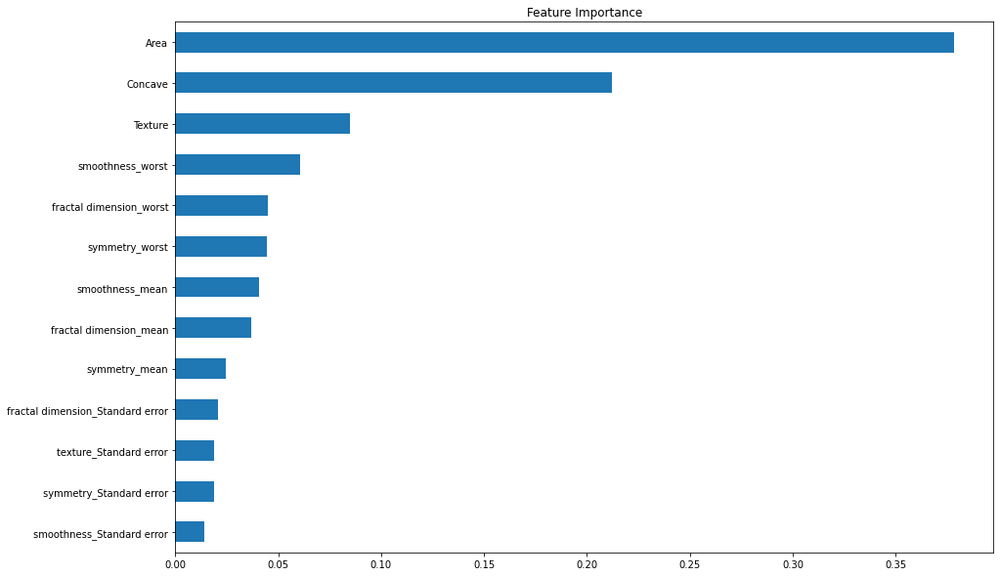

In [150]:
X_ = np.array(breast_cancer_normalized_data_columns)
importance_scores = random_forest_classifier.feature_importances_

plt.figure(figsize=(15, 10))

feature_importances = pd.Series(random_forest_classifier.feature_importances_, index = X_)
feature_importances.nlargest(20).sort_values(ascending=True).plot(kind='barh')
plt.title('Feature Importance')
plt.show()

### Hasil dari Kedua Feature Selection

Dari hasil kedua feature selection, kita bisa melihat bahwa kedua hasil menunjukkan bahwa area, concave, texture, dan smoothness worst memiliki nilai yang lebih tinggi dibandingkan dengan yang lainnya.

Maka dari itu, kita hanya akan menggunakan fitur-fitur tersebut sebagai fitur-fitur untuk diproses oleh machine learning.

In [151]:
breast_cancer_selected_features = [pca_area_field, pca_concave_field, pca_texture_field, smoothness_worst_field]

In [152]:
x_train_selected_features = x_train_pca.copy()
x_test_selected_features = x_test_pca.copy()

x_train_selected_features = x_train_selected_features[breast_cancer_selected_features]
x_test_selected_features = x_test_selected_features[breast_cancer_selected_features]

### Variance Inflation Factor

Di sini, kita akan menggunakan nilai VIF. VIF menentukan kekuatan korelasi antara semua fitur-fitur independen yang ada pada dataset tersebut. Ia diprediksikan dengan mengambil variabel dan melakukan regresi dengan variabel tersebut satu per satu. Dari hasil skor VIF, kita bisa melihat seberapa baiknya variabel tersebut berkorelasi dengan variabel lainnya.

Perhatikan gambar pada correlation plot pada bagian Correlation Plot - Correlation/ Relationship. Kita bisa melihat bahwa ada beberapa variabel independen yang memiliki korelasi tinggi antar variabel-variabel tersebut. Ini menunjukkan bahwa potensi pengaruh perubahan nilai pada variabel jika satu variabel lainnya naik menjadi lebih drastis. Dalam kasus ini, model akan mengalami bias. Hal ini merupakan faktor yang harus dihindari saat melakukan regresi.

Nilai VIF memiliki rentang sebagai berikut.

* Jika nilai VIF adalah 1, maka ia tidak memiliki korelasi apapun
* Jika nilai VIF berada di atas 5 atau 10 (tergantung kondisi), maka ia memiliki korelasi yang tinggi antar variabel independen lainnya.

Rumus dari VIF adalah sebagai berikut.

$\mathrm{VIF = 1 / (1 - R ^ 2)}$

Dari rumus di atas, R^2 memiliki arti yang sama pada paragraf-paragraf di atas, yaitu seberapa baiknya variabel independen berkorelasi kepada variabel independen lainnya.

In [153]:
breast_cancer_values = x_train_selected_features[breast_cancer_selected_features].values

print(breast_cancer_values)
print(breast_cancer_values.T)

[[-6.31861236e+02 -3.32989266e-01 -1.03613665e+01  1.21600000e-01]
 [ 6.33250625e+01 -1.11822130e-01 -7.97876026e+00  1.20600000e-01]
 [-5.55862117e+02 -1.76564404e-01 -9.51202012e+00  1.12100000e-01]
 ...
 [-4.30375808e+02 -2.04709466e-01 -9.69633344e+00  1.37400000e-01]
 [-7.37988527e+01 -2.69707167e-02  1.60548511e+00  1.25700000e-01]
 [ 1.19975989e+03 -7.02898819e-02 -3.17846270e+00  1.23800000e-01]]
[[-6.31861236e+02  6.33250625e+01 -5.55862117e+02 ... -4.30375808e+02
  -7.37988527e+01  1.19975989e+03]
 [-3.32989266e-01 -1.11822130e-01 -1.76564404e-01 ... -2.04709466e-01
  -2.69707167e-02 -7.02898819e-02]
 [-1.03613665e+01 -7.97876026e+00 -9.51202012e+00 ... -9.69633344e+00
   1.60548511e+00 -3.17846270e+00]
 [ 1.21600000e-01  1.20600000e-01  1.12100000e-01 ...  1.37400000e-01
   1.25700000e-01  1.23800000e-01]]


In [154]:
vif = [variance_inflation_factor(breast_cancer_values, i) for i in range(len(breast_cancer_values.T))]
pd.DataFrame({'VIF': vif[0:]}, index = breast_cancer_selected_features).T

,Area,Concave,Texture,smoothness_worst
VIF,1.611119,1.638253,1.151609,1.008882


Dari hasil VIF di atas, kita bisa mengecek bahwa semua fitur-fitur tersebut memiliki nilai di bawah 10. Maka dari itu, akan terdapat sedikit pengaruh antara satu variabel dengan variabel lain, sehingga model tidak akan mengalami bias.

### Label Encoding

Label encoder bertujuan agar ia bisa melakukan konversi non numerik menjadi numerikal. Hal ini disebabkan karena machine learning hanya bisa melakukan pemrosesan data dengan angka.

Perlu diingat, label encoder digunakan ketika data tersebut menunjukkan hubungan tingkatan. Di sini, kita melihat bahwa benign lebih kecil tingkat keparahannya daripada malignant. Maka dari itu, kita bisa mengubahnya dengan label encoder.

In [155]:
y_train_label_encoded = y_train.copy()
y_test_label_encoded = y_test.copy()

y_train_label_encoded.columns = [diagnosis_field]
y_test_label_encoded.columns = [diagnosis_field]

y_train_label_encoded

152    B
355    B
159    B
586    M
666    M
      ..
578    M
53     B
350    B
79     M
520    M
Name: diagnosis, Length: 537, dtype: object

In [156]:
label_encoder = LabelEncoder()
y_train_label_encoded = label_encoder.fit_transform(y_train_label_encoded)
y_test_label_encoded = label_encoder.transform(y_test_label_encoded)

print(y_train_label_encoded)

[0 0 0 1 1 0 1 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 1 0 1 0 0 0
 1 1 0 1 1 1 1 0 0 0 1 0 1 0 0 1 1 0 0 1 0 0 0 1 0 1 0 0 1 0 1 1 1 1 0 1 0
 0 1 0 0 0 0 1 0 0 1 1 0 0 1 1 0 0 1 0 1 0 1 1 1 0 0 0 0 1 0 0 1 1 1 0 1 1
 1 0 0 0 1 1 1 1 0 1 1 1 1 0 0 0 0 0 1 1 0 1 1 0 0 1 1 0 1 0 0 1 1 1 1 1 1
 0 1 0 0 0 1 1 1 1 1 1 1 0 0 0 1 1 0 0 1 1 0 1 1 1 1 0 1 1 1 0 0 1 1 1 1 1
 1 0 0 0 1 0 0 1 0 0 0 1 1 0 1 1 0 0 1 1 1 1 0 1 1 1 0 0 1 0 0 0 1 0 0 0 1
 0 0 0 1 0 0 0 1 1 0 0 1 0 1 0 0 1 1 1 0 1 0 1 0 1 1 1 1 0 0 1 0 1 0 0 0 0
 0 1 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 1 1 1 0 0 1 0 1 1 0 1 0 1 1 1 0 1 1
 0 0 1 1 0 0 1 1 0 0 0 1 0 1 1 0 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0
 0 1 1 0 0 0 1 0 1 1 1 0 0 0 0 1 0 0 1 1 0 0 1 0 1 1 0 0 0 0 0 1 1 0 1 1 0
 0 1 1 0 0 0 1 0 0 1 0 0 1 1 0 1 0 1 0 1 1 0 1 1 1 0 0 0 1 1 1 1 1 0 1 0 1
 0 1 1 0 1 1 1 0 0 0 0 1 0 0 1 0 1 1 1 1 1 1 1 0 0 0 1 1 1 0 1 0 0 0 0 1 0
 1 1 1 1 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 1 0 0 1 1 0 0 0 0 0 1 0 1 0
 0 1 1 1 1 1 0 0 0 1 1 1 

### Scaling

Dalam hal ini, saya akan mencoba untuk melakukan normalisasi hasil yang ada. Tujuan dari normalisasi ini adalah agar kita bisa melakukan pemerataan data.

Di sini, saya akan menggunakan MinMaxScaler. MinMaxScaler bertujuan untuk melakukan pengurangan range pada data kita. Setelah menerapkan MinMaxScaler, range pada data kita berkisar di antara 0 - 1, baik dalam sumbu x ataupun y.

In [157]:
min_max_scaler = MinMaxScaler()

x_train_scaled = x_train_selected_features.copy()
x_test_scaled = x_test_selected_features.copy()

x_train_scaled[breast_cancer_selected_features] = min_max_scaler.fit_transform(x_train_scaled[breast_cancer_selected_features])
x_test_scaled[breast_cancer_selected_features] = min_max_scaler.transform(x_test_scaled[breast_cancer_selected_features])

Melakukan data visualization setelah teknik-teknik data preprocessing di atas.

In [158]:
pairplot_train_df = pd.concat([x_train_scaled, y_train], axis = 1, copy = True)
pairplot_test_df = pd.concat([x_test_scaled, y_test], axis = 1, copy = True)

pairplot_test_df

,Area,Concave,Texture,smoothness_worst,diagnosis
268,0.051133,0.011663,0.256414,0.129832,B
105,0.605675,0.364432,0.408829,0.617198,M
54,0.339046,0.801712,0.591405,0.746370,M
191,0.092267,0.104564,0.367759,0.525740,B
299,0.124032,0.262059,0.261045,0.537054,B
...,...,...,...,...,...
660,0.289814,0.387915,0.770938,0.587026,M
267,0.216826,0.050810,0.286790,0.263624,B
384,0.208572,0.118361,0.433776,0.344711,B
580,0.380776,0.404607,0.731355,0.765227,M


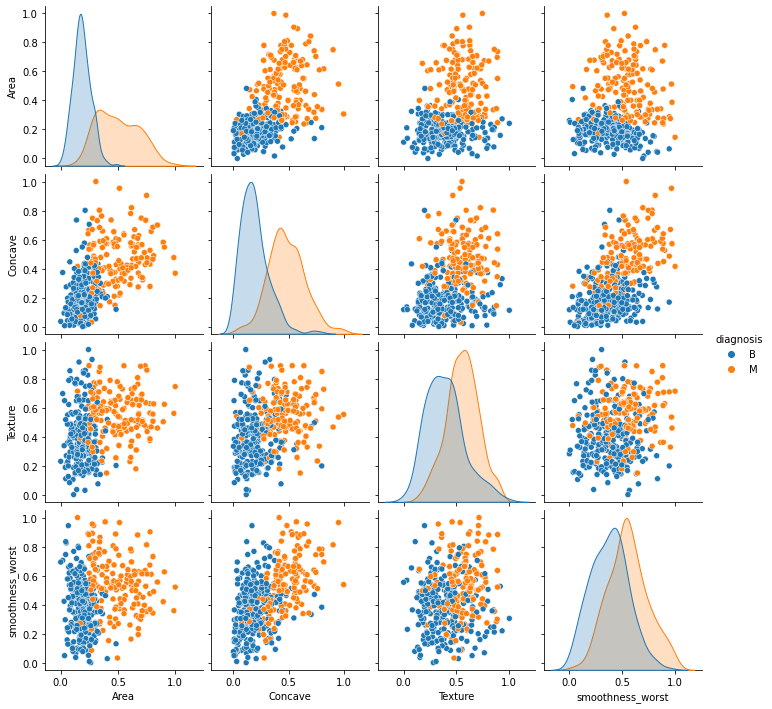

In [159]:
sns.pairplot(data = pairplot_train_df, hue = diagnosis_field)
plt.show()

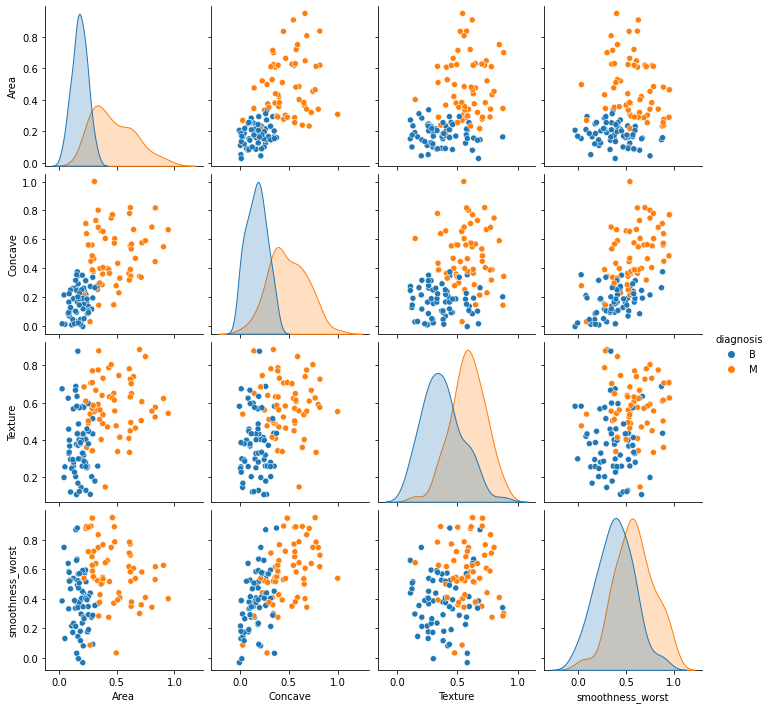

In [160]:
sns.pairplot(data = pairplot_test_df, hue = diagnosis_field)
plt.show()

5D Dimension Plotting

Mata manusia hanya bisa melihat sampai tiga dimensi saja. Namun, dalam hal ini, kita bisa mengakalinya dengan melakukan cara sebagai berikut.

* Area, concave, dan texture akan menjadi axis
* Smoothness_worst akan menjadi besar bubble pada setiap poin.
* Diagnosis akan membuat warna plotting menjadi berbeda.

Dalam kasus ini, kita akan menggunakan plotly untuk melakukan plotting 5 dimensi, karena visualisasi dengan library ini akan lebih mudah dibandingkan dengan matplotlib.

In [161]:
scatter_3d_df = pairplot_train_df.copy()

In [162]:
fig1 = px.scatter_3d(scatter_3d_df,
    x = pca_area_field,
    y = pca_concave_field,
    z = pca_texture_field,
    size = smoothness_worst_field,
    size_max = 25,
    color = diagnosis_field,
)

fig1.update_layout(margin = dict (l = 10, r = 0, b = 0, t = 0))

## Data Modelling

Apabila kita cek dari hasil pairplot di atas, dapat dikatakan bahwa ia dapat dipisahkan dengan garis linear. Maka dari itu, kita akan mencoba untuk menggunakan eksplorasi model linear untuk mendapatkan prediksi yang sesuai.

Kita akan mencoba menggunakan model-model berikut:

- Linear Classification
- SVC
- Logistic Regression

Tidak hanya itu, pada proyek ini, saya akan melakukan hyperparameter tuning secara otomatis. Dengan hyperparameter tuning secara otomatis, kita bisa lebih fokus untuk memilih model dan preprocessing yang tepat. Hal ini tentu akan lebih menghemat waktu untuk mendapatkan hyperparameter yang tepat.

Terdapat dua teknik hyperparameter tuning secara otomatis, yaitu Grid Search dan Random Search. Dalam proyek ini, saya akan menggunakan Grid Search saja. Keuntungan menggunakan grid search adalah karena ia melihat kombinasi hyperparameter yang terbaik dari parameter-parameter dan nilai-nilai parameter yang saya tentukan. Jika menggunakan random search, maka kecepatan menentukan nilai parameter bisa lebih cepat, namun tidak seakurat Grid Search. Oleh karena itu, di sini, saya akan menggunakan Grid Search.

In [163]:
y_train_modelling = y_train_label_encoded.copy()
y_test_modelling = y_test_label_encoded.copy()

Inisialisasi Model

In [164]:
linear_classification_model = SGDClassifier(random_state = 100)
svc_model = svm.LinearSVC(random_state = 100)
logistic_regression_model = LogisticRegression(random_state = 100)

models = [linear_classification_model, svc_model, logistic_regression_model]
model_names = ['Linear Classification', 'Support Vector Classifier', 'Logistic Regression']

Inisialisasi parameter-parameter model dan nilainya

In [165]:
linear_classification_parameters = {
    'max_iter': [100, 400, 700, 1000],
    'tol': [1e-3, 1e-5, 1e-6, 1e-8, 1e-10],
    'fit_intercept': [True, False],
    'alpha': [1e-4, 1e-5, 1e-6]
}

svc_parameters = {
    'max_iter': [100, 400, 700, 1000],
    'tol': [1e-3, 1e-5, 1e-6, 1e-8, 1e-10],
    'fit_intercept': [True, False],
}

logistic_regression_parameters = {
    'tol': [1e-3, 1e-5, 1e-6, 1e-8, 1e-10],
    'C': [1, 1.2, 1.6, 2, 2.4, 2.8],
    'fit_intercept': [True, False]
}

grid_search_parameters = [linear_classification_parameters, svc_parameters, logistic_regression_parameters]

Melakukan running pada grid search, untuk melihat parameter-parameter terbaik dari nilai-nilai yang diberikan.

In [166]:
for index, parameter in enumerate(grid_search_parameters):
    grid_search = GridSearchCV(models[index], parameter)
    grid_search.fit(x_train_scaled, y_train_modelling)
    print(f"{model_names[index]}:")
    print(grid_search.best_params_)
    print()

Linear Classification:
{'alpha': 0.0001, 'fit_intercept': True, 'max_iter': 100, 'tol': 0.001}



C:\Users\user\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\user\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\user\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\user\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\user\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

C:\Users\user\AppData\Local\Programs\Python\Python39\lib\site-packages\skle

Support Vector Classifier:
{'fit_intercept': True, 'max_iter': 100, 'tol': 0.001}

Logistic Regression:
{'C': 2.8, 'fit_intercept': True, 'tol': 0.001}



### Linear Classification dengan Schocastic Gradient Descent

![Gradient Descent](https://michael-fuchs-python.netlify.app/post/2019-11-11-introduction-to-sgd-classifier_files/p32s1.png)

Sumber: https://michael-fuchs-python.netlify.app/post/2019-11-11-introduction-to-sgd-classifier_files/p32s1.png

SGD adalah salah satu algoritma machine learning yang digunakan untuk meminimalisir fungsi cost. Algoritma ini melakukan komputasi gradien menggunakan satu sampel data. Dengan ini, SGD bisa melakukan mini-batching learning. Dengan mini-batching, SGD secara perlahan-lahan mampu sampai ke titik minimum pada suatu kurva.

Salah satu keuntungan menggunakan schocastic gradient descent adalah ramah memori. Hal ini merupakan berkat dari mini batching. Tidak semua data langsung diproses, sehingga algoritma ini efisien untuk komputer dengan memori rendah.

In [167]:
linear_classification_model = SGDClassifier(
    alpha = 0.0001,
    fit_intercept = True,
    max_iter = 100,
    tol = 0.001,
    random_state = 100
)

linear_classification_model.fit(
    x_train_scaled,
    y_train_label_encoded
)

SGDClassifier(max_iter=100, random_state=100)

Melakukan visualisasi plotting dari Linear Classification

In [168]:
print(f"Intercept: {linear_classification_model.intercept_}")
print(f"Coefficients: {linear_classification_model.coef_}")

Intercept: [-11.17658395]
Coefficients: [[18.14238545  3.31935683  4.7879051   4.43093017]]


Melakukan prediksi machine learning

In [169]:
breast_cancer_linear_train_predictions = linear_classification_model.predict(x_train_scaled)
breast_cancer_linear_test_predictions = linear_classification_model.predict(x_test_scaled)

### SVC (Scalable Vector Classifier)

![Support Vector Machine](https://static.javatpoint.com/tutorial/machine-learning/images/support-vector-machine-algorithm5.png)

Sumber: https://static.javatpoint.com/tutorial/machine-learning/images/support-vector-machine-algorithm5.png

Algoritma ini bekerja dengan menentukan support vector sebagai pembentuk garis. Dari gambar di atas, SVM akan membuat garis dengan margin maksimal yang memisahkan daerah masing-masing kelas. Maka dari itu, semakin besar gap yang dibentuk dari garis, SVM akan semakin baik mendeteksi kelas-kelas yang dipisahkan oleh garis, karena terdapat ruang kosong jika data yang diprediksi memiliki nilai fitur yang lumayan berbeda dengan data training.

![SVM Mapping Dimension](https://www.researchgate.net/profile/Mona-Soliman-Habib-2/publication/267938227/figure/fig4/AS:669368325267460@1536601253122/SVM-Mapping-to-Higher-Dimension-Feature-Space.ppm)

Sumber: https://www.researchgate.net/profile/Mona-Soliman-Habib-2/publication/267938227/figure/fig4/AS:669368325267460@1536601253122/SVM-Mapping-to-Higher-Dimension-Feature-Space.ppm

Hal yang membuat SVM luar biasa adalah kemampuan untuk mentransformasikan suatu dimensi menjadi dimensi tertentu. Cara melakukan transformasi ini adalah dengan menggunakan kernel. Hal ini akan membuat model menjadi semakin mudah untuk mendeteksi garis yang bisa memisahkan antar kelas-kelas.

In [170]:
svc_model = svm.LinearSVC(
    fit_intercept = True,
    max_iter = 100,
    tol = 0.001,
    random_state = 100 
)

svc_model.fit(
    x_train_scaled,
    y_train_modelling
)

LinearSVC(max_iter=100, random_state=100, tol=0.001)

Melakukan prediksi dari SVC

In [171]:
breast_cancer_svc_train_predictions = svc_model.predict(x_train_scaled)
breast_cancer_svc_test_predictions = svc_model.predict(x_test_scaled)

### Logistic Regression

![Logistic Regression](https://upload.wikimedia.org/wikipedia/commons/thumb/c/cb/Exam_pass_logistic_curve.svg/400px-Exam_pass_logistic_curve.svg.png)

Sumber: https://upload.wikimedia.org/wikipedia/commons/thumb/c/cb/Exam_pass_logistic_curve.svg/400px-Exam_pass_logistic_curve.svg.png

Model ini bukan merupakan model untuk kasus regresi, namun untuk klasifikasi. Model ini menggunakan kombinasi dari persaman garis lurus dengan persamaan sigmoid. Kombinasi ini akan membentuk persamaan yang digunakan untuk logistic regression.

Untuk menentukan nilai pada fitur-fitur yang ada, logistic regression menggunakan threshold. Secara default, logistic regression memiliki nilai threshold 0.5. Ini berarti bahwa peluang untuk setiap nilai fitur bernilai 0 atau 1 adalah 50%.

In [172]:
logistic_regression_model = LogisticRegression(
    C = 2.8,
    fit_intercept = True,
    tol = 0.001,
    random_state = 100
)

logistic_regression_model.fit(
    x_train_scaled,
    y_train_modelling
)

LogisticRegression(C=2.8, random_state=100, tol=0.001)

Melakukan prediksi dari logistic regression

In [173]:
breast_cancer_logistic_train_predictions = logistic_regression_model.predict(x_train_scaled)
breast_cancer_logistic_test_predictions = logistic_regression_model.predict(x_test_scaled)

## Evaluation

Pada tahap ini, saya akan melakukan evaluasi machine learning dari berbagai model-model di atas.

Tujuan dari evaluasi adalah agar kita bisa mengetahui apakah model-model di atas memiliki kualitas yang bagus untuk memprediksi machine learning.

Dalam kasus ini, terdapat beberapa metrik yang digunakan, yaitu sebagai berikut.

* Confusion Matrix
* Classification Report (Accuracy, F1-Score, Precision, Recall, dan Support)

Mendapatkan semua hasil prediksi.

In [174]:
breast_cancer_test_predictions = [
    breast_cancer_linear_test_predictions,
    breast_cancer_svc_test_predictions,
    breast_cancer_logistic_test_predictions
]

breast_cancer_train_predictions = [
    breast_cancer_linear_train_predictions,
    breast_cancer_svc_train_predictions,
    breast_cancer_logistic_train_predictions
]

Classification Report

Dalam Classification Report, terdapat beberapa elemen, yaitu sebagai berikut.

* **Precision:** perbandingan antara nilai True Positive (TP) dengan banyaknya data yang diprediksi positif.

    Rumus: $\frac{TP}{TP+FP}$

* **Recall:** perbandingan antara nilai True Positive (TP) dengan banyaknya data yang sebenarnya positif.

    Rumus: $\frac{TP}{TP+FN}$

* **F1-Score:** harmonic mean dari precision dan recall. Jika F1-Score memiliki skor yang baik, maka nilai precision dan recall kita baik.

    Rumus: $\frac{2*Precision*Recall}{Precision+Recall} = \frac{2*TP}{2*TP+FP+FN}$

* **Support:** jumlah sampel yang benar pada setiap label yang terdapat pada suatu dataset.

* **Accuracy:**  nilai pecahan yang menunjukkan rasio antara jumlah data yang diprediksi benar dengan total jumlah data yang ada.

    Rumus: $\frac{TP+TN}{TP+TN+FP+FN}$

Train

In [181]:
for index, prediction in enumerate(breast_cancer_train_predictions):
    print(f"{model_names[index]}:")
    print(classification_report(
        y_pred = prediction,
        y_true = y_train_modelling,
    ))

Linear Classification:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       269
           1       0.99      0.94      0.97       268

    accuracy                           0.97       537
   macro avg       0.97      0.97      0.97       537
weighted avg       0.97      0.97      0.97       537

Support Vector Classifier:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       269
           1       0.98      0.96      0.97       268

    accuracy                           0.97       537
   macro avg       0.97      0.97      0.97       537
weighted avg       0.97      0.97      0.97       537

Logistic Regression:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       269
           1       0.97      0.95      0.96       268

    accuracy                           0.96       537
   macro avg       0.96      0.96      0.96       537
wei

Test

In [182]:
for index, prediction in enumerate(breast_cancer_test_predictions):
    print(f"{model_names[index]}:")
    print(classification_report(
        y_pred = prediction,
        y_true = y_test_modelling,
    ))

Linear Classification:
              precision    recall  f1-score   support

           0       0.93      1.00      0.96        67
           1       1.00      0.93      0.96        68

    accuracy                           0.96       135
   macro avg       0.97      0.96      0.96       135
weighted avg       0.97      0.96      0.96       135

Support Vector Classifier:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        67
           1       1.00      0.96      0.98        68

    accuracy                           0.98       135
   macro avg       0.98      0.98      0.98       135
weighted avg       0.98      0.98      0.98       135

Logistic Regression:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        67
           1       1.00      0.96      0.98        68

    accuracy                           0.98       135
   macro avg       0.98      0.98      0.98       135
wei

Confusion Matrix

Dalam bagian ini, terdapat empat elemen penting, yaitu sebagai berikut.

* **True Negative (TN)**: jumlah data berlabel **positif** yang diprediksi **benar** oleh model machine learning.
* **True Positive (TP)**: jumlah data berlabel **positif** yang diprediksi **salah** oleh model machine learning.
* **False Negative (FN)**: jumlah data berlabel **negatif** yang diprediksi **benar** oleh model machine learning.
* **False Positive (FP)**: jumlah data berlabel **negatif** yang diprediksi **salah** oleh model machine learning.

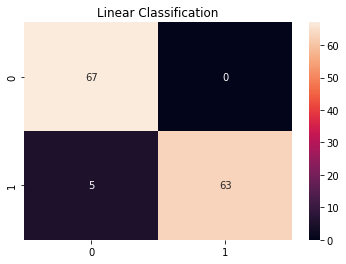

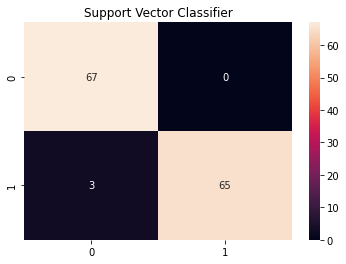

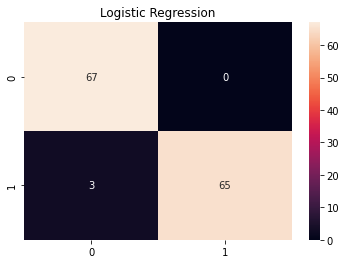

In [176]:
for index, prediction in enumerate(breast_cancer_test_predictions):
    breast_cancer_confusion_matrix = confusion_matrix(
        y_pred = prediction,
        y_true = y_test_modelling
    )
    plt.title(model_names[index])
    sns.heatmap(breast_cancer_confusion_matrix, annot = True)

    plt.show()


## Analisis Hasil

Berdasarkan hasil dari berbagai metrik evaluasi di atas, kita bisa mendapat berbagai insight sebagai berikut.

* Dari hasil training dan testing accuracy, model mengalami good fit. Hal ini disebabkan karena perbedaan pada nilai accuracy tersebut tidak berbeda jauh, bahkan ada yang sama.

* Model-model di atas memiliki nilai F1-Score yang sangat tinggi. Maka dari itu, nilai recall dan precision juga memiliki nilai yang sangat baik.

* Semua model sedikit memiliki kecenderungan untuk mendeteksi bahwa pasien memiliki kanker ganas (malignant). Hal ini bisa dilihat pada confusion matrix pada bagian false negative. Namun, hal ini tidak terlalu menjadi kendala bagi kita, karena hal ini tidak membahayakan nyawa manusia dan hanya menjadi false alarm pada deteksi kanker.